# Выпускная квалификационная работа по теме "Прогнозирование конечных свойств новых материалов (композиционных материалов)"


In [2]:
#импорт библиотек
!pip install scikeras
import scikeras
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import tensorflow as tf
from tensorflow import keras as keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, Activation
from pandas import read_excel, DataFrame, Series
from scikeras.wrappers import KerasClassifier, KerasRegressor
from tensorflow.keras.models import Sequential
import sklearn
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from numpy.random import seed
from scipy import stats
import warnings
warnings.filterwarnings("ignore")
from google.colab import drive
drive.mount('/content/drive')
import scipy

Mounted at /content/drive


In [3]:
#импорт датасетов
bp = pd.read_excel('/content/drive/MyDrive/вкр/X_bp.xlsx')
nup = pd.read_excel('/content/drive/MyDrive/вкр/X_nup.xlsx')

#удаляем первую колонку - нумерацию
bp.drop(['Unnamed: 0'], axis = 1, inplace = True)
nup.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [4]:
#проверяем формы датасетов перед объединением
bp.shape

(1023, 10)

In [5]:
nup.shape

(1040, 3)

In [6]:
#объединяем датасеты в один через INNER
dat = bp.merge(nup, left_index = True, right_index = True, how = 'inner')
dat.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [7]:
#check shape
dat.shape

(1023, 13)

In [8]:
#проверяем инфрмацию о датасете (сколько, какой тип)
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

In [ ]:
#узнаем количество уникальных значений
dat.nunique()

,0
Соотношение матрица-наполнитель,1014
"Плотность, кг/м3",1013
"модуль упругости, ГПа",1020
"Количество отвердителя, м.%",1005
"Содержание эпоксидных групп,%_2",1004
"Температура вспышки, С_2",1003
"Поверхностная плотность, г/м2",1004
"Модуль упругости при растяжении, ГПа",1004
"Прочность при растяжении, МПа",1004
"Потребление смолы, г/м2",1003


In [ ]:
#описание данных
dat.describe()
#для узнавания среднего значения и медианы

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [ ]:
#корреляция по Кендаллу (потому что в .describe нет такого параметра)
dat.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


In [ ]:
#Корреляция по Пирсону (нет такого параметра в .describe)
dat.corr(method = 'pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


In [ ]:
#проверка на наличие пустых клеток (нет таких)
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


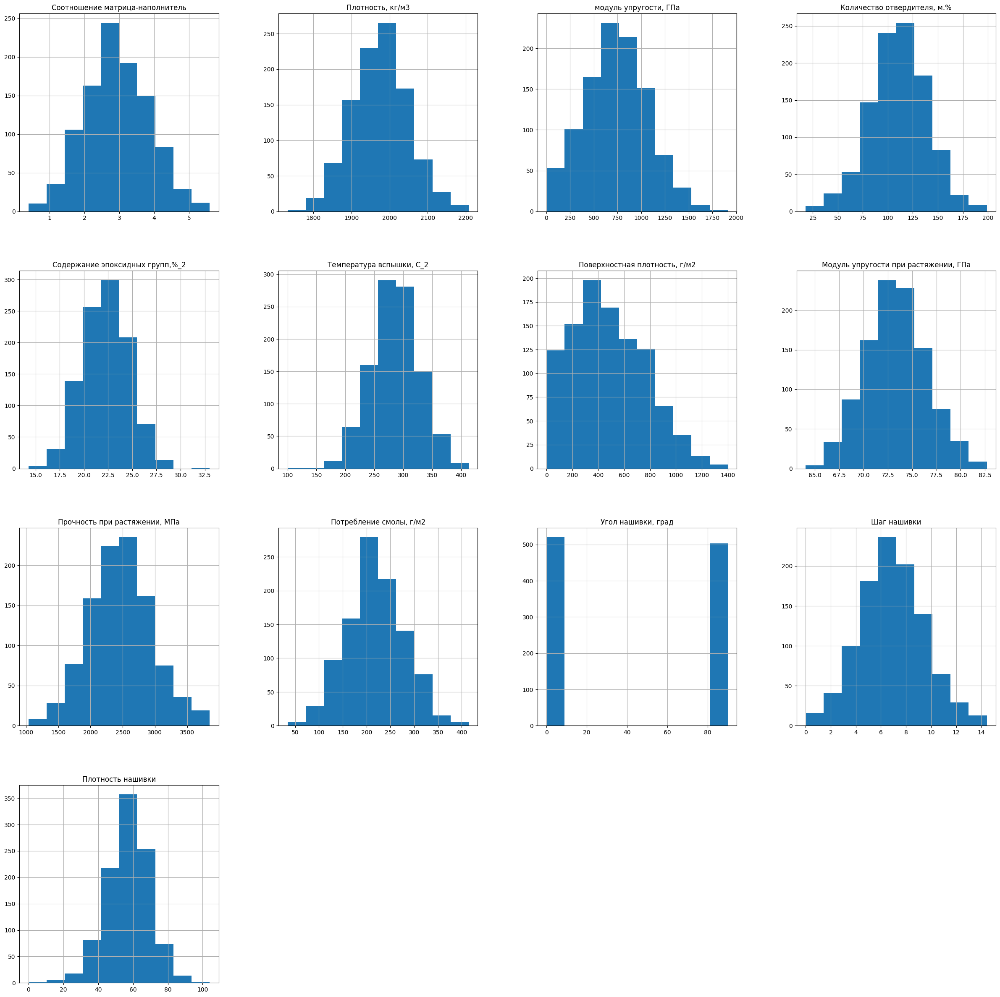

In [10]:
#гистограммы
dat.hist(figsize = (30,30))
plt.show()

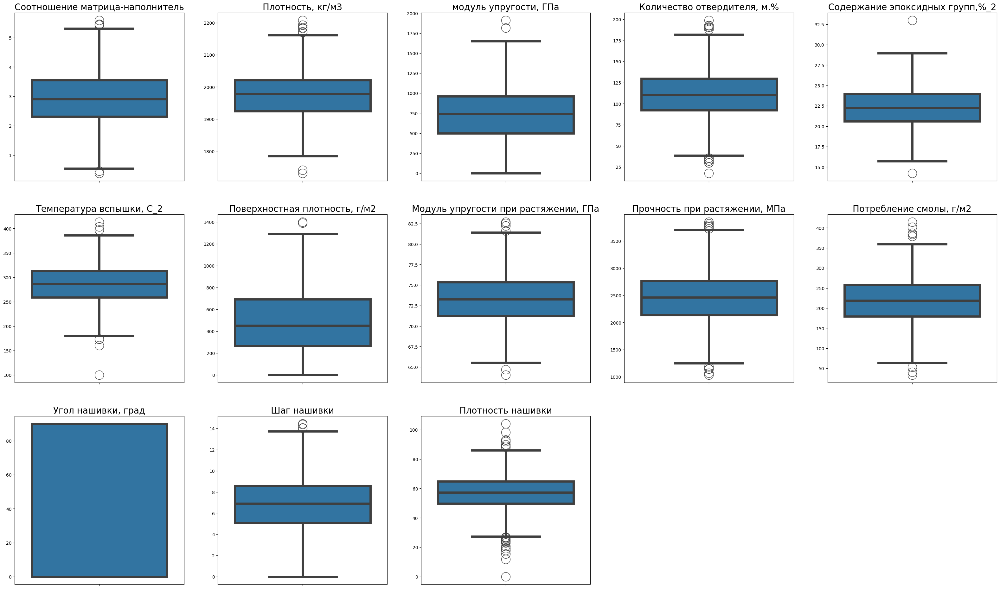

In [11]:
#ящики с усами (много выбросов!)
plt.figure(figsize = (40, 40))
q = 1
for i in dat.columns:
  plt.subplot(5, 5, q)
  sns.boxplot(data = dat, y = dat[i], fliersize = 20, linewidth = 5)
  plt.ylabel(None)
  plt.title(i, size = 20)
  q+=1

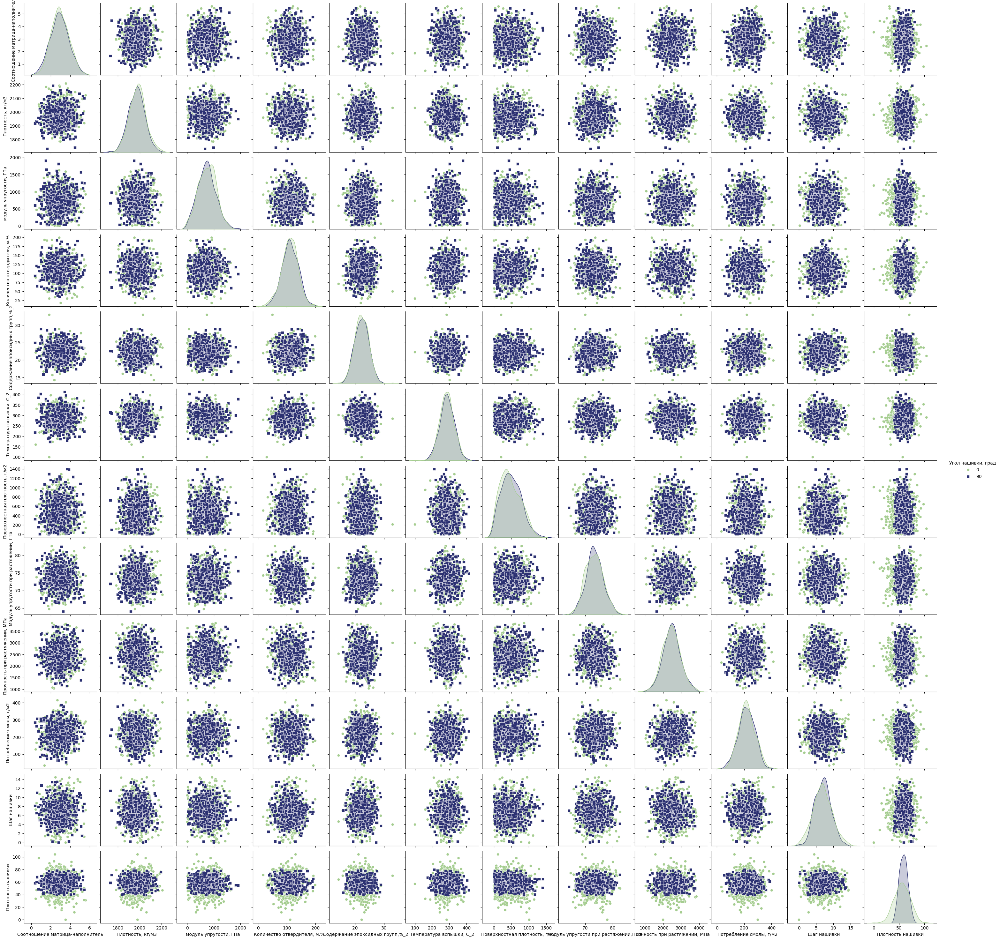

In [ ]:
#графики попарного рассеивания точек
sns.pairplot(dat, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette='crest')

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5]),
 [Text(0.5, 0, 'Соотношение матрица-наполнитель'),
  Text(1.5, 0, 'Плотность, кг/м3'),
  Text(2.5, 0, 'модуль упругости, ГПа'),
  Text(3.5, 0, 'Количество отвердителя, м.%'),
  Text(4.5, 0, 'Содержание эпоксидных групп,%_2'),
  Text(5.5, 0, 'Температура вспышки, С_2'),
  Text(6.5, 0, 'Поверхностная плотность, г/м2'),
  Text(7.5, 0, 'Модуль упругости при растяжении, ГПа'),
  Text(8.5, 0, 'Прочность при растяжении, МПа'),
  Text(9.5, 0, 'Потребление смолы, г/м2'),
  Text(10.5, 0, 'Угол нашивки, град'),
  Text(11.5, 0, 'Шаг нашивки'),
  Text(12.5, 0, 'Плотность нашивки')])

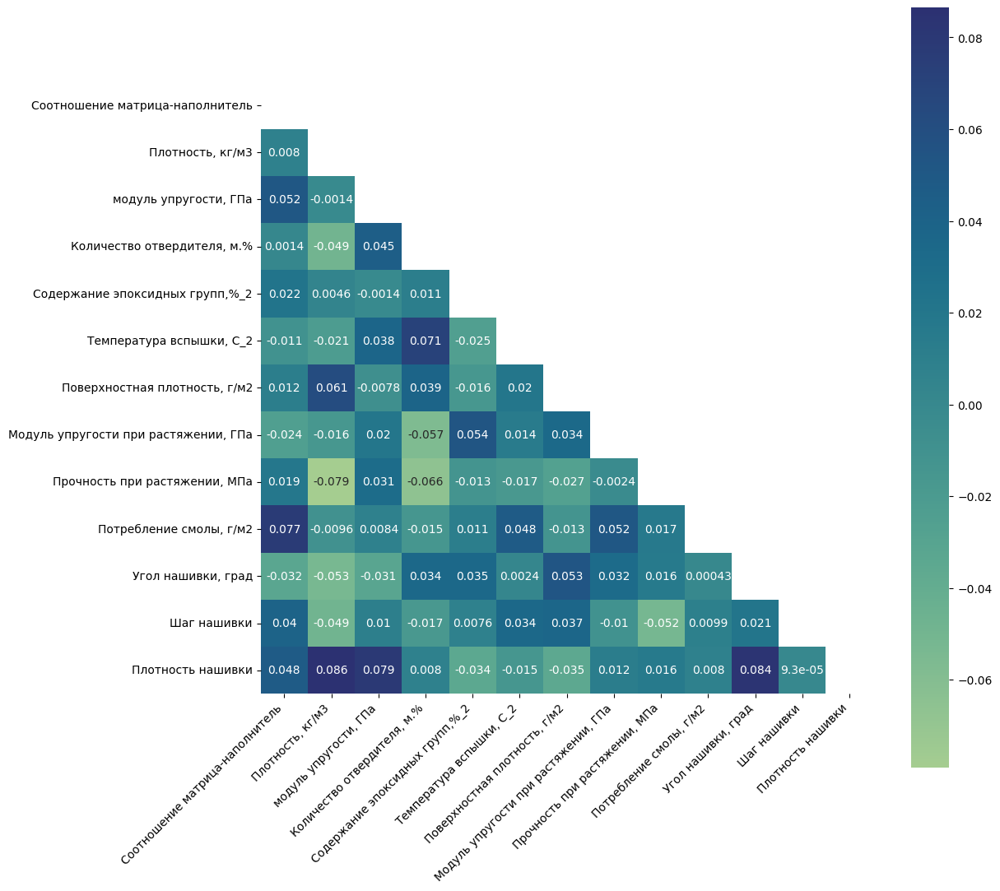

In [ ]:
#тепловая карта
plt.rcParams["figure.figsize"] = (12, 12)
sns.heatmap(
    data = dat.corr(), mask = np.triu(dat.corr()),
    square=True,
    annot=True,
    cmap = 'crest')
plt.xticks(rotation = 45, ha = 'right')

In [ ]:
cols = dat.columns
dat.isna().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


In [12]:
#удаление выбросов
#выявление выбросов методом трех сигм
threes = 0
ct = []
for column in dat:
  q = dat.loc[:, [column]]
  score = (dat[column] - dat[column].mean())/ dat[column].std()
  q['sigma'] = score.abs() > 3
  threes += q['sigma'].sum()
  ct.append(q['sigma'].sum())
  print(column, '3-sigma:', q['sigma'].sum())
print('кол-во выбросов методом трех сигм:', threes)

Соотношение матрица-наполнитель 3-sigma: 0
Плотность, кг/м3 3-sigma: 3
модуль упругости, ГПа 3-sigma: 2
Количество отвердителя, м.% 3-sigma: 2
Содержание эпоксидных групп,%_2 3-sigma: 2
Температура вспышки, С_2 3-sigma: 3
Поверхностная плотность, г/м2 3-sigma: 2
Модуль упругости при растяжении, ГПа 3-sigma: 0
Прочность при растяжении, МПа 3-sigma: 0
Потребление смолы, г/м2 3-sigma: 3
Угол нашивки, град 3-sigma: 0
Шаг нашивки 3-sigma: 0
Плотность нашивки 3-sigma: 7
кол-во выбросов методом трех сигм: 24


In [13]:
#выявление методом межквартильных расстояний
iq = 0
iqct = []
for column in dat:
  q = dat.loc[:, [column]]
  quart1 = np.quantile(dat[column], 0.25)
  quart3 = np.quantile(dat[column], 0.75)
  inter = quart3 - quart1
  lo = quart1 - 1.5*inter
  hi = quart3 + 1.5*inter
  q['interquart'] = (dat[column]<= lo) | (dat[column] >= hi)
  iq += q['interquart'].sum()
  iqct.append(q['interquart'].sum())
  print(column, ': ', q['interquart'].sum())
print('кол-во выбросов методом межквартильных расстояний:', iq)

Соотношение матрица-наполнитель :  6
Плотность, кг/м3 :  9
модуль упругости, ГПа :  2
Количество отвердителя, м.% :  14
Содержание эпоксидных групп,%_2 :  2
Температура вспышки, С_2 :  8
Поверхностная плотность, г/м2 :  2
Модуль упругости при растяжении, ГПа :  6
Прочность при растяжении, МПа :  11
Потребление смолы, г/м2 :  8
Угол нашивки, град :  0
Шаг нашивки :  4
Плотность нашивки :  21
кол-во выбросов методом межквартильных расстояний: 93


In [14]:
#удаление выбросов методом межквартильных размахов (потому что этим методом выявилось больше значений, значит чистка будет быстрее)
cllist = ["Соотношение матрица-наполнитель",
          "Плотность, кг/м3",
          "модуль упругости, ГПа",
          "Количество отвердителя, м.%",
          "Содержание эпоксидных групп,%_2",
          "Температура вспышки, С_2",
          "Поверхностная плотность, г/м2",
          "Модуль упругости при растяжении, ГПа",
          "Прочность при растяжении, МПа",
          "Потребление смолы, г/м2",
          "Шаг нашивки",
          "Плотность нашивки"]

for i in cllist:
    q75, q25 = np.percentile(dat.loc[:,i], [75,25])
    inter = q75 - q25
    ma = q75 + 1.5*inter
    mi = q25 - 1.5*inter
    dat.loc[dat[i] < mi, i] = np.nan
    dat.loc[dat[i] > ma, i] = np.nan
dat.isnull().sum()
#выявили выбросы, заменили их нулями

,0
Соотношение матрица-наполнитель,6
"Плотность, кг/м3",9
"модуль упругости, ГПа",2
"Количество отвердителя, м.%",14
"Содержание эпоксидных групп,%_2",2
"Температура вспышки, С_2",8
"Поверхностная плотность, г/м2",2
"Модуль упругости при растяжении, ГПа",6
"Прочность при растяжении, МПа",11
"Потребление смолы, г/м2",8


In [15]:
#удаляем нули
dat = dat.dropna(axis = 0)
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


In [16]:
dat.info()
#стало чище

<class 'pandas.core.frame.DataFrame'>
Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int64  
 11  Шаг нашивки            

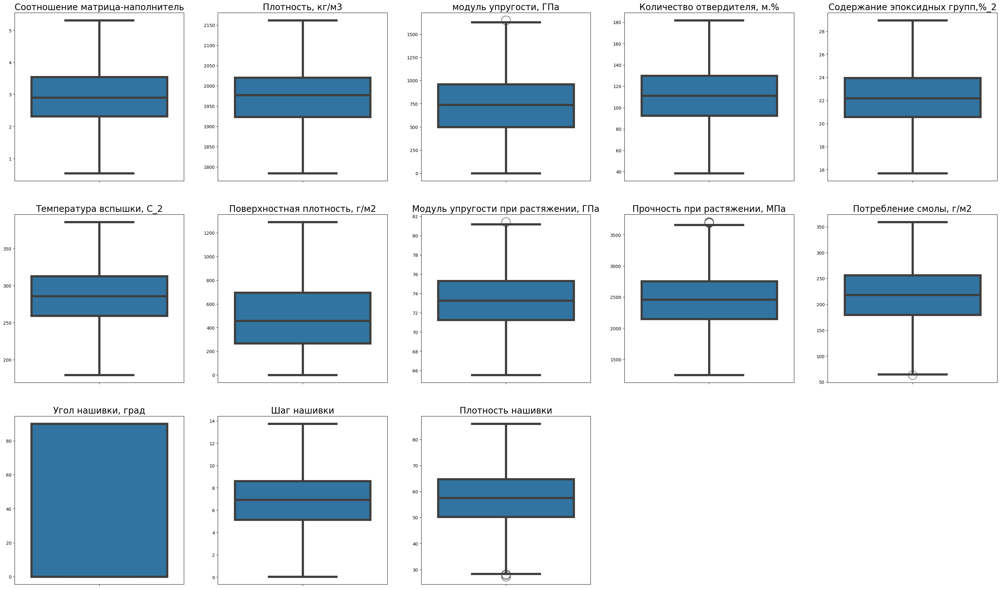

In [17]:
#проверяем насколько хорошо мы справились с чисткой (не очень хорошо)
plt.figure(figsize = (40, 40))
q = 1
for i in dat.columns:
  plt.subplot(5, 5, q)
  sns.boxplot(data = dat, y = dat[i], fliersize = 20, linewidth = 5)
  plt.ylabel(None)
  plt.title(i, size = 20)
  q+=1

In [18]:
#то же самое еще раз
for i in cllist:
    q75, q25 = np.percentile(dat.loc[:,i], [75,25])
    inter = q75 - q25
    ma = q75 + 1.5*inter
    mi = q25 - 1.5*inter
    dat.loc[dat[i] < mi, i] = np.nan
    dat.loc[dat[i] > ma, i] = np.nan
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",1
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",1
"Прочность при растяжении, МПа",4
"Потребление смолы, г/м2",1


In [19]:
dat = dat.dropna(axis = 0)
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


In [20]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 926 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       926 non-null    float64
 1   Плотность, кг/м3                      926 non-null    float64
 2   модуль упругости, ГПа                 926 non-null    float64
 3   Количество отвердителя, м.%           926 non-null    float64
 4   Содержание эпоксидных групп,%_2       926 non-null    float64
 5   Температура вспышки, С_2              926 non-null    float64
 6   Поверхностная плотность, г/м2         926 non-null    float64
 7   Модуль упругости при растяжении, ГПа  926 non-null    float64
 8   Прочность при растяжении, МПа         926 non-null    float64
 9   Потребление смолы, г/м2               926 non-null    float64
 10  Угол нашивки, град                    926 non-null    int64  
 11  Шаг нашивки            

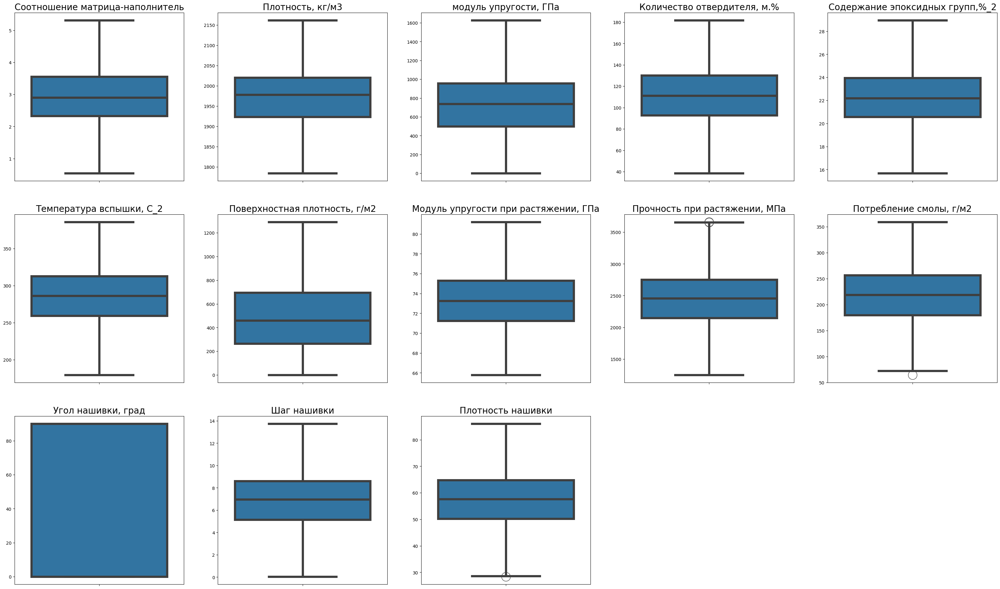

In [21]:
#проверяем еще раз (получше, но всё ещё плохо)
plt.figure(figsize = (40, 40))
q = 1
for i in dat.columns:
  plt.subplot(5, 5, q)
  sns.boxplot(data = dat, y = dat[i], fliersize = 20, linewidth = 5)
  plt.ylabel(None)
  plt.title(i, size = 20)
  q+=1

In [22]:
#три - волшебное число (чистим выбросы ЕЩЁ раз)
for i in cllist:
    q75, q25 = np.percentile(dat.loc[:,i], [75,25])
    inter = q75 - q25
    ma = q75 + 1.5*inter
    mi = q25 - 1.5*inter
    dat.loc[dat[i] < mi, i] = np.nan
    dat.loc[dat[i] > ma, i] = np.nan
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",2
"Потребление смолы, г/м2",1


In [23]:
dat = dat.dropna(axis = 0)
dat.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


In [24]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    int64  
 11  Шаг нашивки            

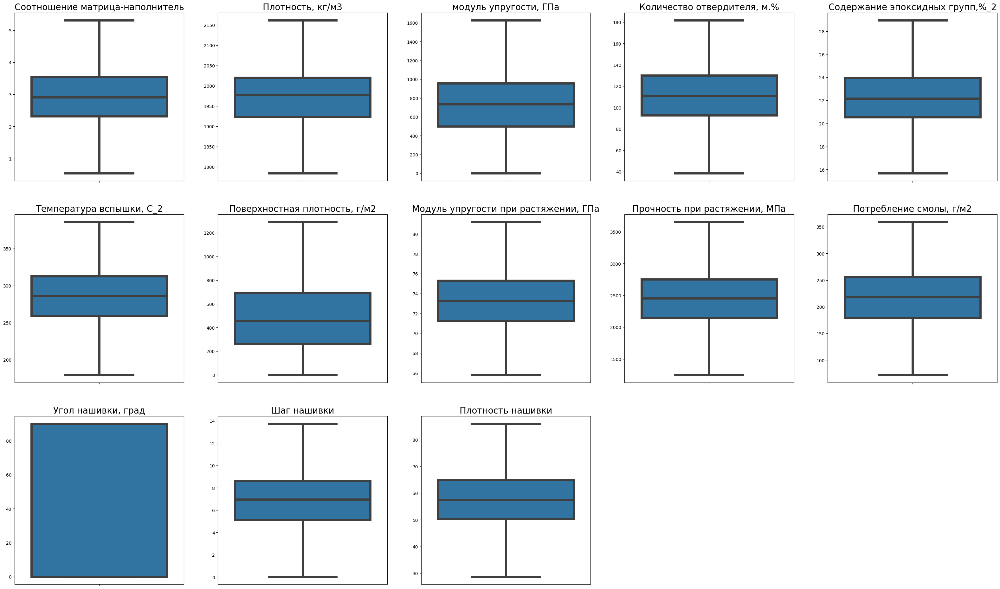

In [25]:
plt.figure(figsize = (40, 40))
q = 1
for i in dat.columns:
  plt.subplot(5, 5, q)
  sns.boxplot(data = dat, y = dat[i], fliersize = 20, linewidth = 5)
  plt.ylabel(None)
  plt.title(i, size = 20)
  q+=1
  #выглядит позитивно, теперь можно строить остальные графики на основе данных без выбросов

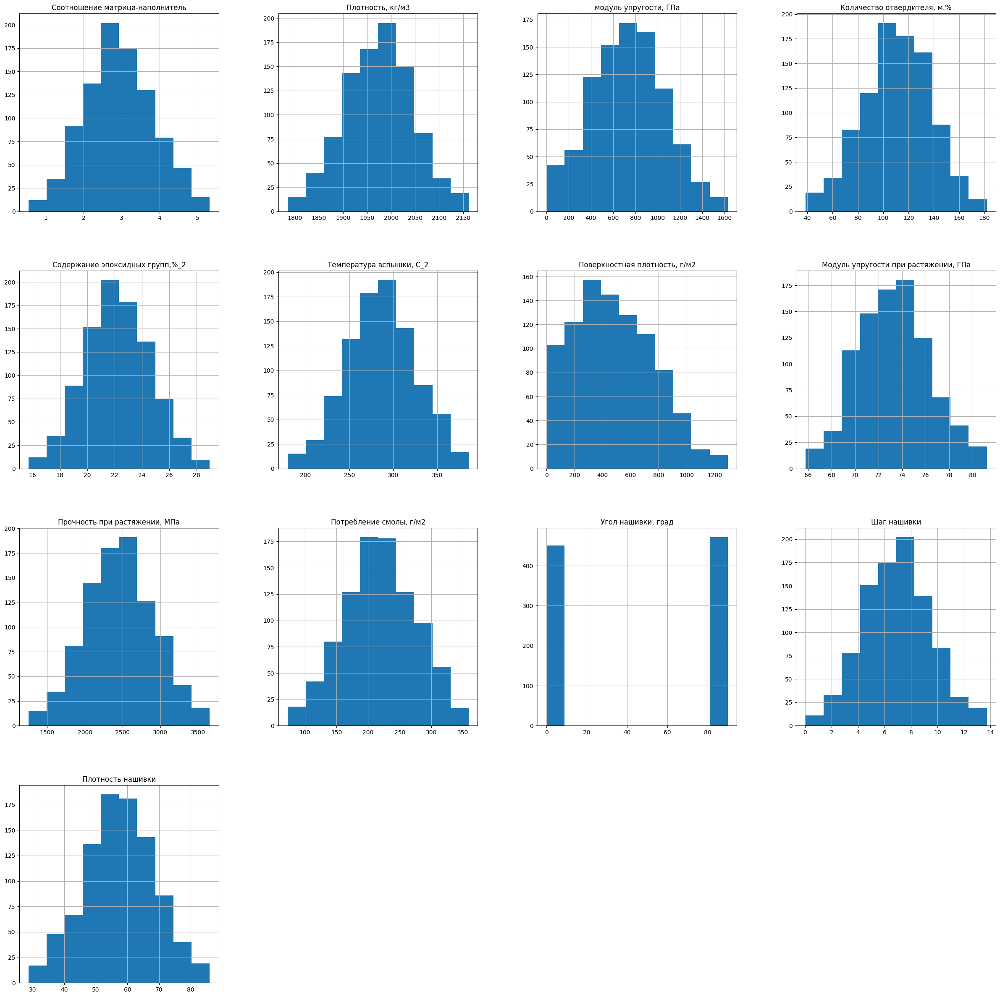

In [26]:
dat.hist(figsize = (30,30))
plt.show()

In [27]:
dat.mean() #срзнач

,0
Соотношение матрица-наполнитель,2.927964
"Плотность, кг/м3",1974.118744
"модуль упругости, ГПа",736.119982
"Количество отвердителя, м.%",111.136066
"Содержание эпоксидных групп,%_2",22.200570
"Температура вспышки, С_2",286.181128
"Поверхностная плотность, г/м2",482.429070
"Модуль упругости при растяжении, ГПа",73.303464
"Прочность при растяжении, МПа",2461.491315
"Потребление смолы, г/м2",218.048059


In [ ]:
dat.min() #минзнач

,0
Соотношение матрица-наполнитель,0.547391
"Плотность, кг/м3",1784.482245
"модуль упругости, ГПа",2.436909
"Количество отвердителя, м.%",38.668500
"Содержание эпоксидных групп,%_2",15.695894
"Температура вспышки, С_2",179.374391
"Поверхностная плотность, г/м2",0.603740
"Модуль упругости при растяжении, ГПа",65.793845
"Прочность при растяжении, МПа",1250.392802
"Потребление смолы, г/м2",72.530873


In [ ]:
dat.max() #максзнач

,0
Соотношение матрица-наполнитель,5.314144
"Плотность, кг/м3",2161.565216
"модуль упругости, ГПа",1628.000000
"Количество отвердителя, м.%",181.828448
"Содержание эпоксидных групп,%_2",28.955094
"Температура вспышки, С_2",386.067992
"Поверхностная плотность, г/м2",1291.340115
"Модуль упругости при растяжении, ГПа",81.203147
"Прочность при растяжении, МПа",3654.434359
"Потребление смолы, г/м2",359.052220


In [ ]:
dat.median() #медиана

,0
Соотношение матрица-наполнитель,2.907832
"Плотность, кг/м3",1977.321002
"модуль упругости, ГПа",736.178435
"Количество отвердителя, м.%",111.162090
"Содержание эпоксидных групп,%_2",22.177681
"Температура вспышки, С_2",286.220763
"Поверхностная плотность, г/м2",457.732246
"Модуль упругости при растяжении, ГПа",73.247594
"Прочность при растяжении, МПа",2455.974462
"Потребление смолы, г/м2",218.697660


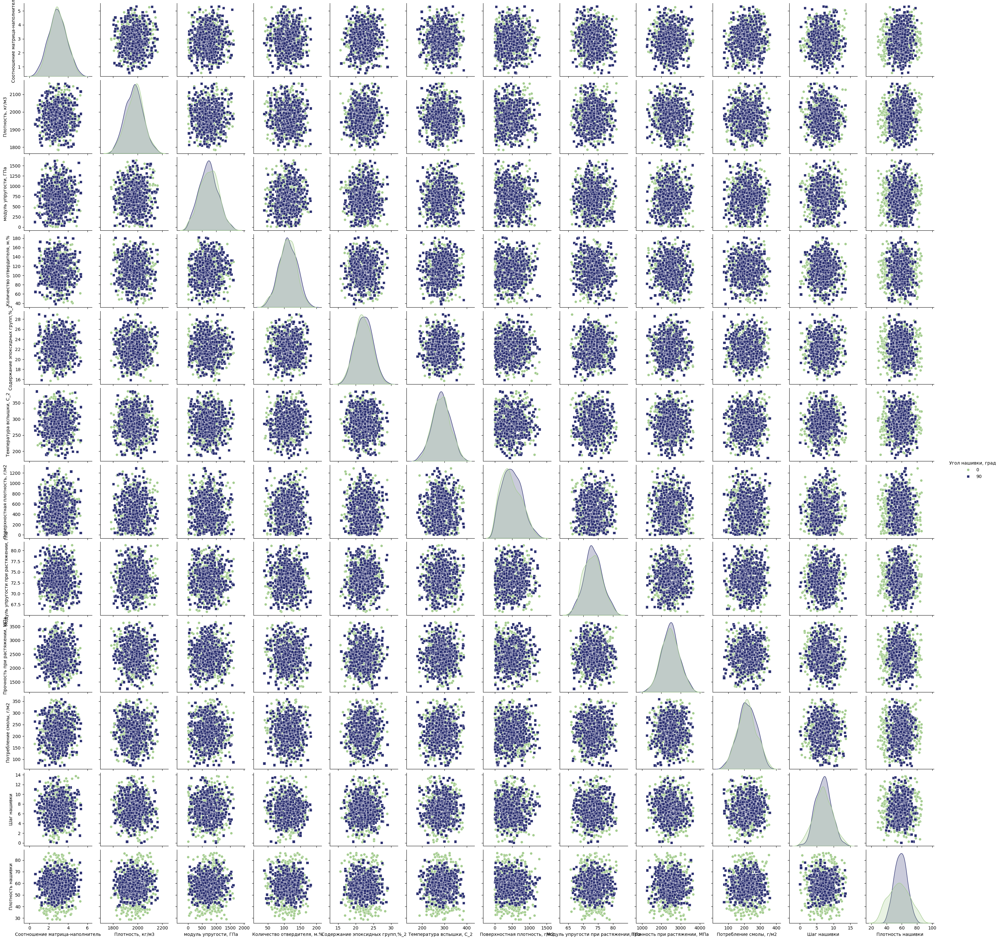

In [ ]:
#попарное рассеивание
sns.pairplot(dat, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette='crest')

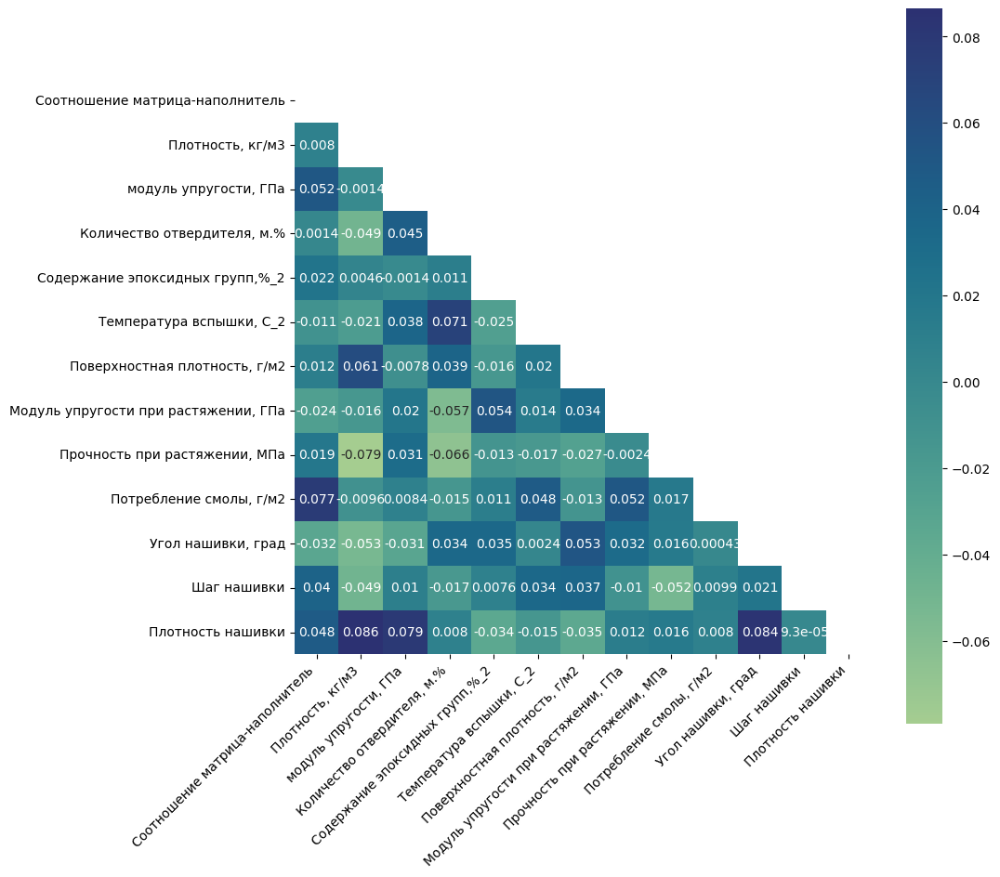

In [ ]:
#тепловая карта
x,y = plt.subplots(figsize = (10,10))
sns.heatmap(dat.corr(), mask = np.triu(dat.corr()), annot = True, square = True, cmap = 'crest')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

In [28]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    int64  
 11  Шаг нашивки            

In [ ]:
dat.to_excel(('/content/drive/MyDrive/вкр/final_data.xlsx')) #сохранили в отдельный файл, может быть потом пригодится

In [ ]:
dat.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,2.927964,1974.118744,736.119982,111.136066,22.200570,286.181128,482.429070,73.303464,2461.491315,218.048059,45.976139,6.931939,57.562887
std,0.895472,71.040648,327.607008,26.753228,2.393926,39.420764,280.437329,3.025864,453.564734,57.137475,45.013829,2.514184,11.122204
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.793845,1250.392802,72.530873,0.000000,0.037639,28.661632
25%,2.320191,1923.318006,498.538615,92.856591,20.556328,259.205321,264.345872,71.241213,2148.175736,179.875097,0.000000,5.143644,50.275385
50%,2.907832,1977.321002,736.178435,111.162090,22.177681,286.220763,457.732246,73.247594,2455.974462,218.697660,90.000000,6.972862,57.584225
75%,3.549367,2020.053266,956.955626,130.109815,23.956980,313.012786,695.531920,75.310130,2751.233766,256.623860,90.000000,8.612094,64.840898
max,5.314144,2161.565216,1628.000000,181.828448,28.955094,386.067992,1291.340115,81.203147,3654.434359,359.052220,90.000000,13.732404,86.012427


In [ ]:
norm = dat.copy() #копия

In [ ]:
norm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 922 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       922 non-null    float64
 1   Плотность, кг/м3                      922 non-null    float64
 2   модуль упругости, ГПа                 922 non-null    float64
 3   Количество отвердителя, м.%           922 non-null    float64
 4   Содержание эпоксидных групп,%_2       922 non-null    float64
 5   Температура вспышки, С_2              922 non-null    float64
 6   Поверхностная плотность, г/м2         922 non-null    float64
 7   Модуль упругости при растяжении, ГПа  922 non-null    float64
 8   Прочность при растяжении, МПа         922 non-null    float64
 9   Потребление смолы, г/м2               922 non-null    float64
 10  Угол нашивки, град                    922 non-null    int64  
 11  Шаг нашивки            

<Axes: ylabel='Density'>

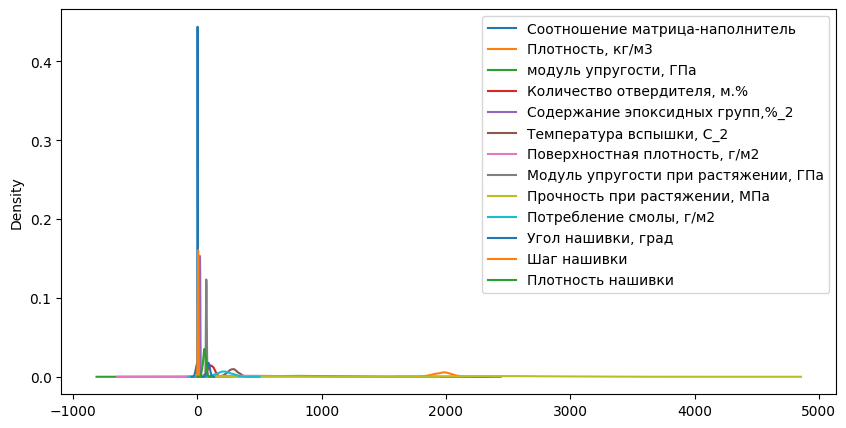

In [ ]:
x, y = plt.subplots(figsize = (10, 5))
norm.plot(kind = 'kde', ax = y)
#судя по графику, стоит нормализовать

In [ ]:
#нормализация через минмаксскейлер
sca = MinMaxScaler()
col = dat.columns
fin = sca.fit_transform(dat)

mima = pd.DataFrame(fin, columns = col)
mima.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
mima #так выглядят данные

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.274768,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.466552,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.465836,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.424236,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.361662,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.607674,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.573391,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.662497,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


[Text(0, 0, 'Соотношение матрица-наполнитель'),
 Text(1, 0, 'Плотность, кг/м3'),
 Text(2, 0, 'модуль упругости, ГПа'),
 Text(3, 0, 'Количество отвердителя, м.%'),
 Text(4, 0, 'Содержание эпоксидных групп,%_2'),
 Text(5, 0, 'Температура вспышки, С_2'),
 Text(6, 0, 'Поверхностная плотность, г/м2'),
 Text(7, 0, 'Модуль упругости при растяжении, ГПа'),
 Text(8, 0, 'Прочность при растяжении, МПа'),
 Text(9, 0, 'Потребление смолы, г/м2'),
 Text(10, 0, 'Угол нашивки, град'),
 Text(11, 0, 'Шаг нашивки'),
 Text(12, 0, 'Плотность нашивки')]

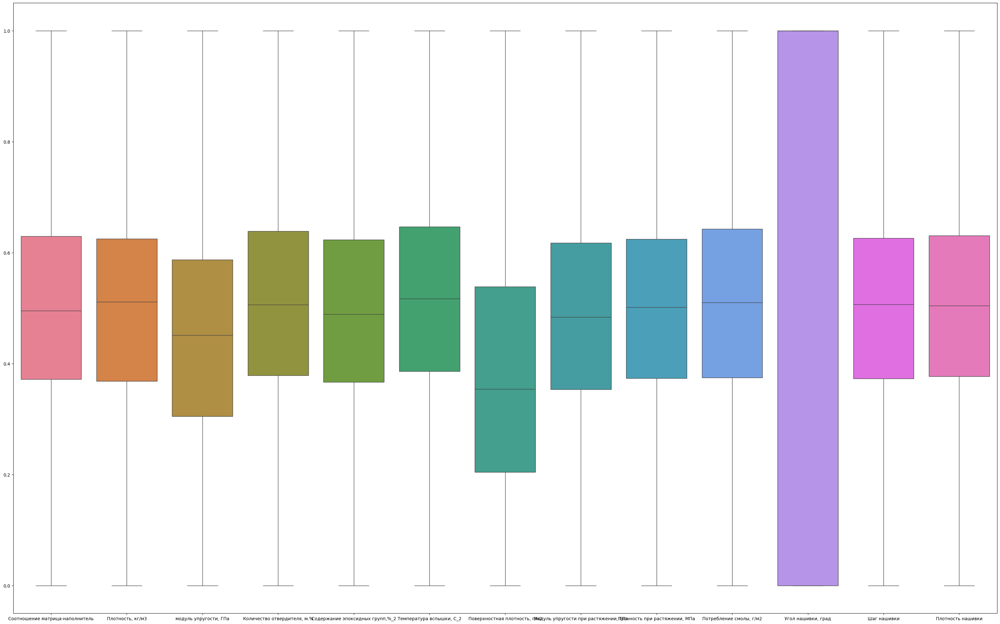

In [ ]:
plt.figure(figsize = (40, 25))
y = sns.boxplot(data = mima)
y.set_xticklabels(y.get_xticklabels())
#смотрим что из этого вышло

<Axes: ylabel='Density'>

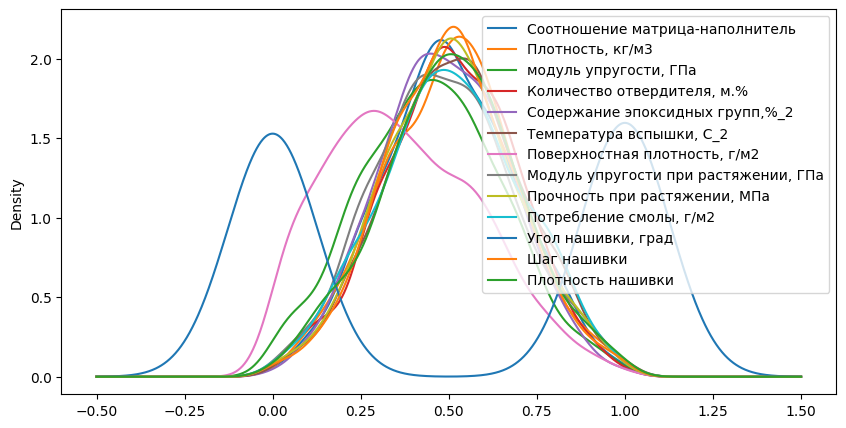

In [ ]:
x, y = plt.subplots(figsize = (10, 5))
mima.plot(kind = 'kde', ax = y)

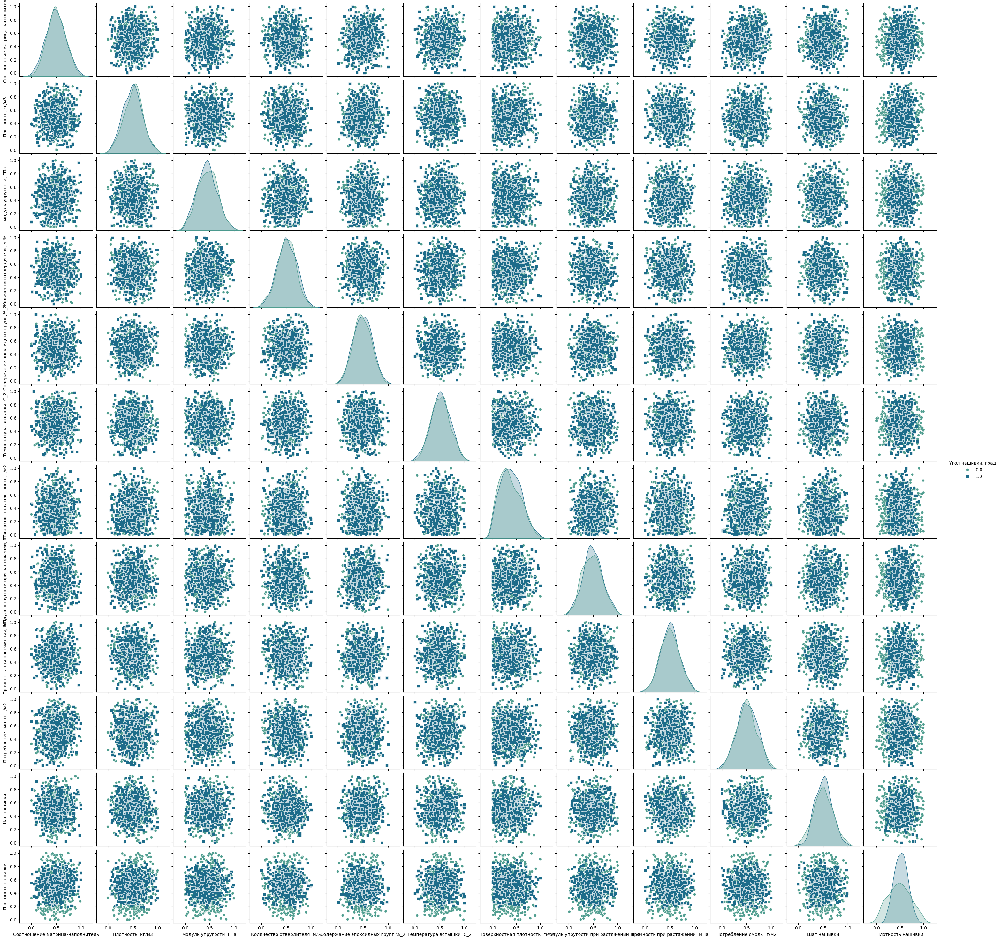

In [ ]:
sns.pairplot(mima, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette='crest')

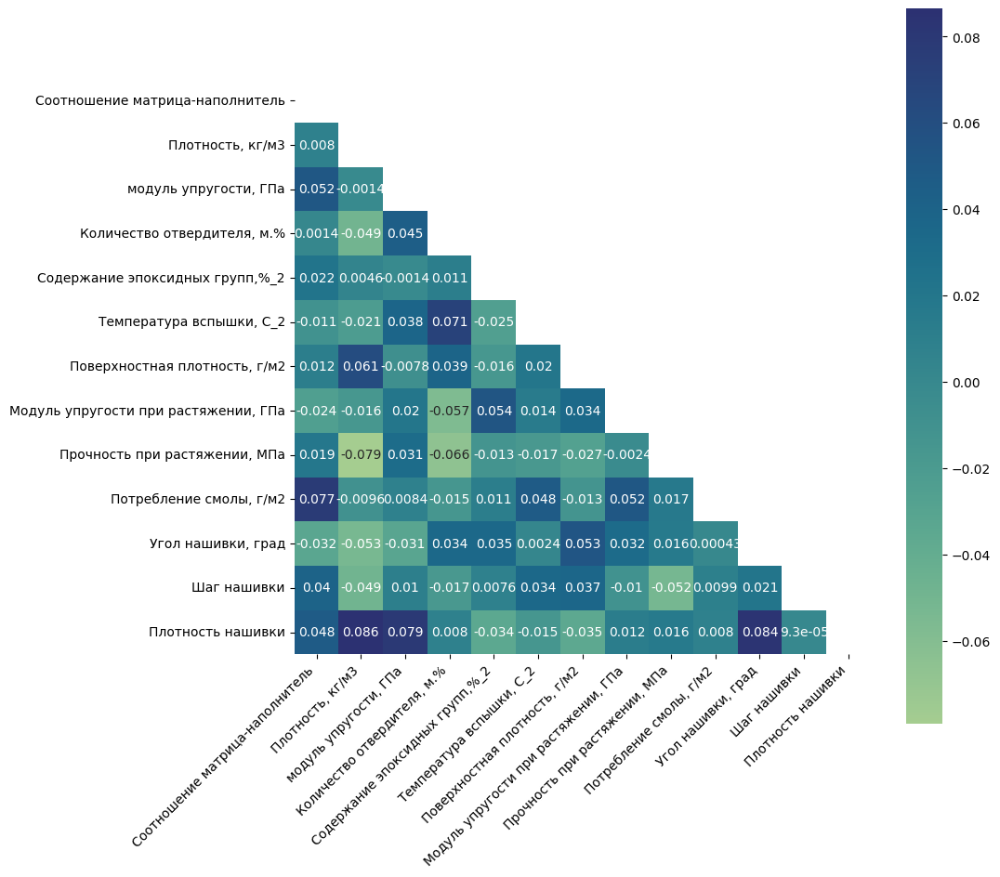

In [ ]:
x,y = plt.subplots(figsize = (10,10))
sns.heatmap(mima.corr(), mask = np.triu(mima.corr()), annot = True, square = True, cmap = 'crest')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

In [29]:
#нормализация через нормалайзер
norma = Normalizer()
ress = norma.fit_transform(dat)
normnorm = pd.DataFrame(ress, columns = dat.columns)
normnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601520,0.281289,0.026806,0.006201,0.100077,0.064463,0.022522,0.735625,0.038520,0.027733,0.002797,0.014489
918,0.001078,0.641541,0.139172,0.045683,0.006133,0.079552,0.109733,0.022819,0.738645,0.036842,0.028164,0.003306,0.016820
919,0.000953,0.572927,0.121081,0.032107,0.006959,0.072161,0.214994,0.021709,0.773510,0.068729,0.026143,0.001209,0.019645
920,0.001191,0.664389,0.238353,0.045454,0.006187,0.088652,0.206205,0.023802,0.665970,0.063368,0.028931,0.002029,0.018728


<Axes: ylabel='Density'>

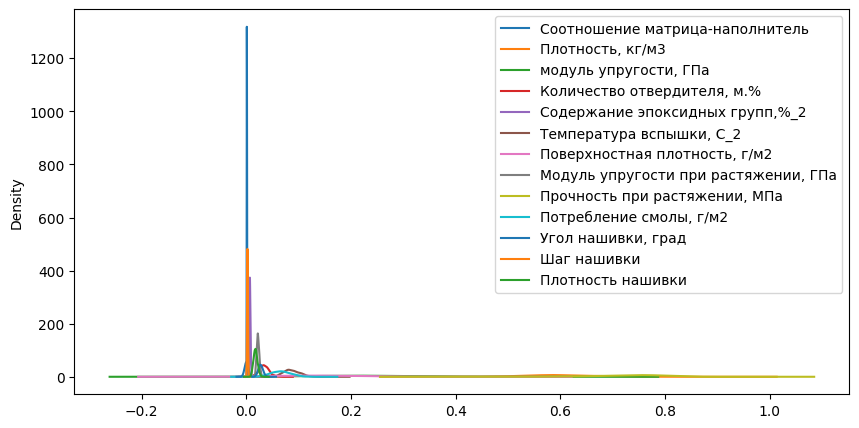

In [ ]:
x, y = plt.subplots(figsize = (10, 5))
normnorm.plot(kind = 'kde', ax = y)

In [ ]:
mima

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.274768,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.466552,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.465836,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.424236,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.361662,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.607674,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.573391,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.662497,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


In [ ]:
m = mima.copy()
n = normnorm.copy()

In [ ]:
#стандартизация
stdm = pd.DataFrame(StandardScaler().fit_transform(m))
stdm

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.733662,-0.310284,0.539767,-0.902956,-0.868217,0.979545,-0.974830,-0.070267,-0.163679,-1.629244,0.978538,0.853400,-0.948449
918,0.576611,1.069974,-0.889924,1.303201,-1.087006,-0.811326,-0.470122,-0.126524,-0.223019,-1.756683,0.978538,1.446055,-0.342933
919,0.394018,-0.024589,-0.975122,-0.022536,0.734311,-0.958342,0.919470,0.473140,0.444312,0.324984,0.978538,-1.102660,0.905599
920,0.868603,1.305328,0.016356,1.131763,-1.234469,-0.263996,0.567419,0.244441,-0.859827,-0.366368,0.978538,-0.246233,0.062808


<Axes: ylabel='Density'>

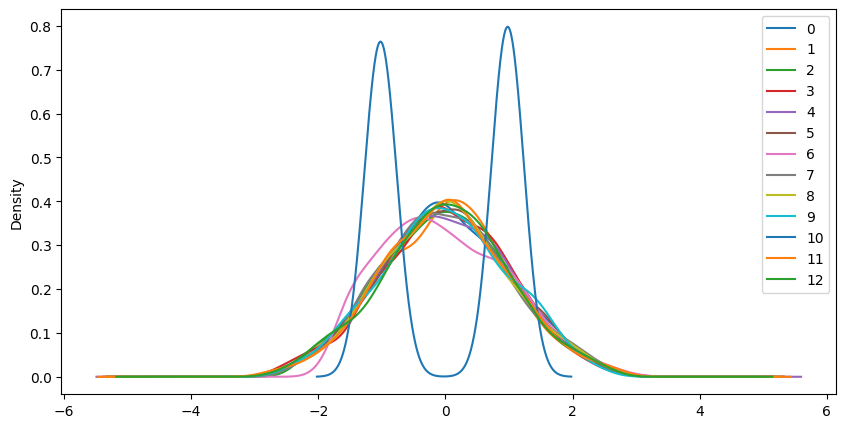

In [ ]:
x, y = plt.subplots(figsize = (10, 5))
stdm.plot(kind = 'kde',ax = y)

In [ ]:
stdn = pd.DataFrame(StandardScaler().fit_transform(n))
stdn

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.350192,-0.799214,-0.225252,-2.254820,-0.328970,-0.670746,-1.055146,-1.354391,1.085327,-0.366843,-1.010334,-1.269833,-0.336654
1,-1.351555,-0.805818,-0.226871,0.109705,-0.994960,-0.399931,-1.055671,-1.360303,1.076239,-0.369337,-1.010334,-0.938452,-1.260561
2,-0.493340,-0.808635,-0.187538,-0.404676,-0.727764,-0.676408,-1.055895,-1.362824,1.072364,-0.370400,-1.010334,-0.939006,-0.553760
3,-0.484470,-0.894906,-0.191820,-0.389125,-0.700427,-0.652807,-1.052772,-1.327673,1.126398,-0.355573,-1.010334,-0.931289,-0.321661
4,-0.648471,-1.195238,-0.003777,-0.357015,-0.643981,-0.604077,-1.046323,-1.255094,1.237965,-0.324958,-1.010334,-0.915357,0.437054
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.646989,0.071191,0.640442,-0.763387,-0.506773,0.899549,-0.959234,0.141979,0.067474,-1.480249,1.005430,0.862355,-0.767250
918,0.675557,0.692301,-0.845442,1.342074,-0.573159,-0.465864,-0.419079,0.261611,0.111113,-1.571006,1.036772,1.493218,-0.152252
919,0.238696,-0.372565,-1.034584,-0.172081,0.240071,-0.957594,0.836860,-0.185900,0.614927,0.153180,0.889866,-1.103964,0.592721
920,1.072359,1.046907,0.191534,1.316523,-0.520298,0.139479,0.731995,0.657348,-0.939056,-0.136692,1.092539,-0.087790,0.351030


<Axes: ylabel='Density'>

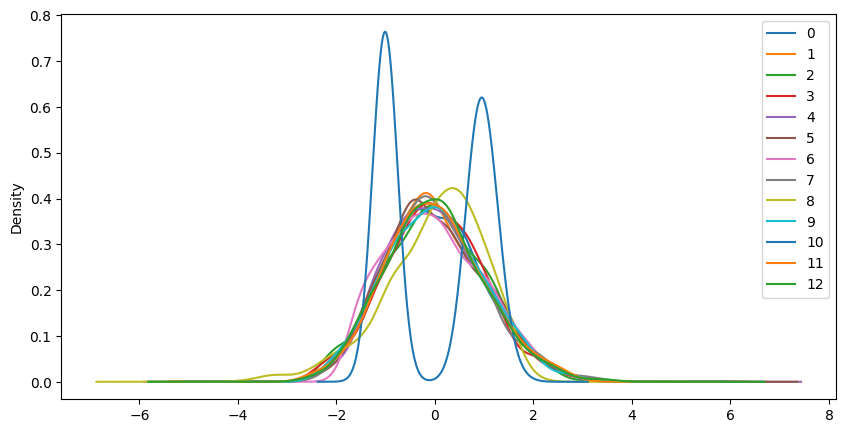

In [ ]:
x, y = plt.subplots(figsize = (10, 5))
stdn.plot(kind = 'kde',ax = y)

In [ ]:
#формируем выборки для обучения предсказателя прочности при растяжении
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(
    normnorm.loc[:, normnorm.columns != 'Прочность при растяжении, МПа'], dat[['Прочность при растяжении, МПа']], test_size = 0.3, random_state = 42)

In [ ]:
#случайный лес
rfr = RandomForestRegressor()
rfr.fit(x_train_1, y_train_1.values)
y_pred_forest = rfr.predict(x_test_1)
mae_rfr = mean_absolute_error(y_pred_forest, y_test_1)
mse_rfr = mean_squared_error(y_test_1, y_pred_forest)
sc_rfr = rfr.score(x_test_1, y_test_1)
print('random forest regressor results:')
print("train test score:",rfr.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_forest)))
print('mse:', mean_squared_error(y_test_1,y_pred_forest))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_forest)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_forest))
print('real test score:', rfr.score(x_test_1, y_test_1))

random forest regressor results:
train test score: 0.9932721044999128
mae: 68
mse: 7746.824058519886
rmse: 88.0160443244292
mape: 0.029490848217891278
real test score: 0.9638077307369525


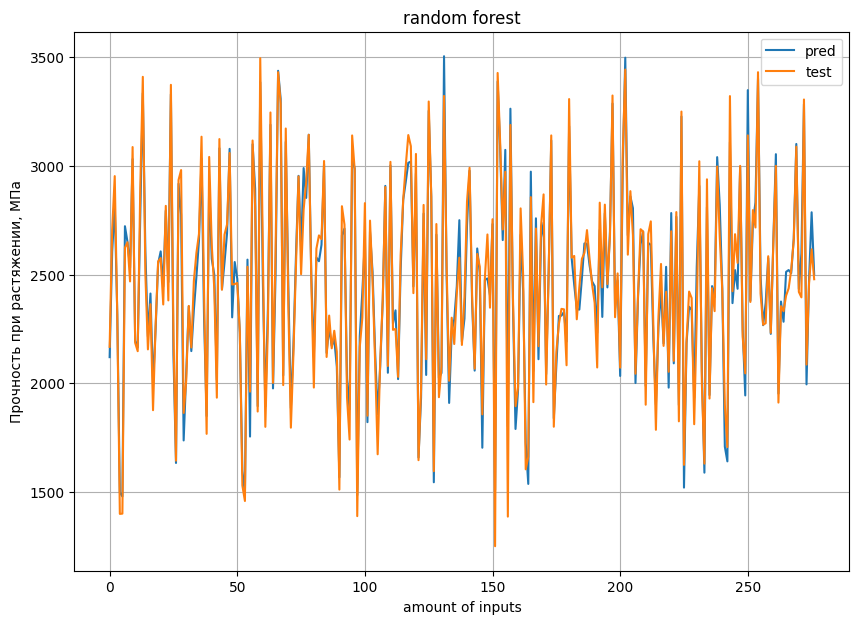

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("random forest")
plt.plot(y_pred_forest, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#линейная регрессия
lr = LinearRegression()
lr.fit(x_train_1, y_train_1.values)
y_pred_lr = lr.predict(x_test_1)
mae_lr = mean_absolute_error(y_pred_lr, y_test_1)
mse_lr = mean_squared_error(y_test_1, y_pred_lr)
sc_lr = lr.score(x_test_1, y_test_1)
print('linear regression regressor results:')
print("train test score:",lr.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_lr)))
print('mse:', mean_squared_error(y_test_1,y_pred_lr))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_lr)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_lr))
print('real test score:', lr.score(x_test_1, y_test_1))

linear regression regressor results:
train test score: 0.9675222015327782
mae: 62
mse: 6150.4827607175475
rmse: 78.42501361630451
mape: 0.026563325556880183
real test score: 0.9712656533190774


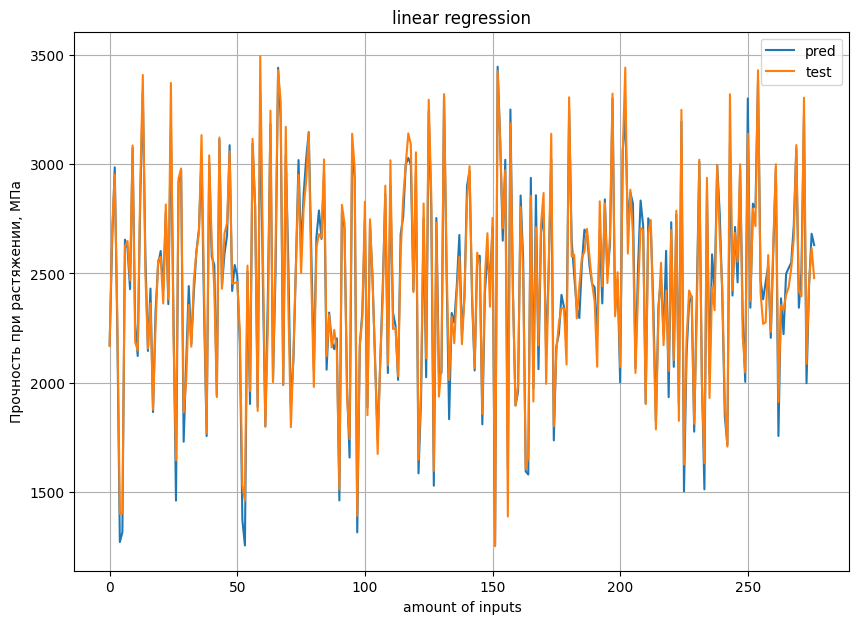

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("linear regression")
plt.plot(y_pred_lr, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#к-соседи
kn = KNeighborsRegressor()
kn.fit(x_train_1, y_train_1)
y_pred_kn = kn.predict(x_test_1)
mae_kn = mean_absolute_error(y_pred_kn, y_test_1)
mse_kn = mean_squared_error(y_test_1, y_pred_kn)
sc_kn = kn.score(x_test_1, y_test_1)
print('k neighbors regression regressor results:')
print("train test score:",kn.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_kn)))
print('mse:', mean_squared_error(y_test_1,y_pred_kn))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_kn)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_kn))
print('real test score:', kn.score(x_test_1, y_test_1))

k neighbors regression regressor results:
train test score: 0.9394587258160543
mae: 102
mse: 16367.88322969372
rmse: 127.93702837604803
mape: 0.044629578052682806
real test score: 0.9235311357738027


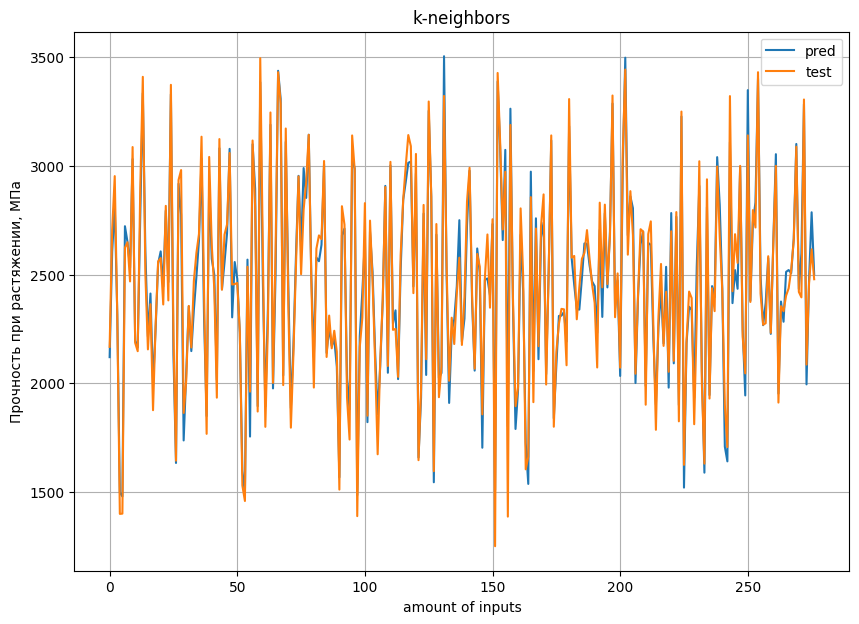

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("k-neighbors")
plt.plot(y_pred_forest, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#многослойный перцептрон
mlp = MLPRegressor()
mlp.fit(x_train_1, y_train_1)
y_pred_mlp = mlp.predict(x_test_1)
mae_mlp = mean_absolute_error(y_pred_kn, y_test_1)
mse_mlp = mean_squared_error(y_test_1, y_pred_mlp)
sc_mlp = mlp.score(x_test_1, y_test_1)
print('multi-layered perceptron regression regressor results:')
print("train test score:",mlp.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_mlp)))
print('mse:', mean_squared_error(y_test_1,y_pred_mlp))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_mlp)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_mlp))
print('real test score:', mlp.score(x_test_1, y_test_1))

multi-layered perceptron regression regressor results:
train test score: -26.901914676610637
mae: 2333
mse: 5661881.367697403
rmse: 2379.4708167358144
mape: 0.9440141296316492
real test score: -25.451657278800766


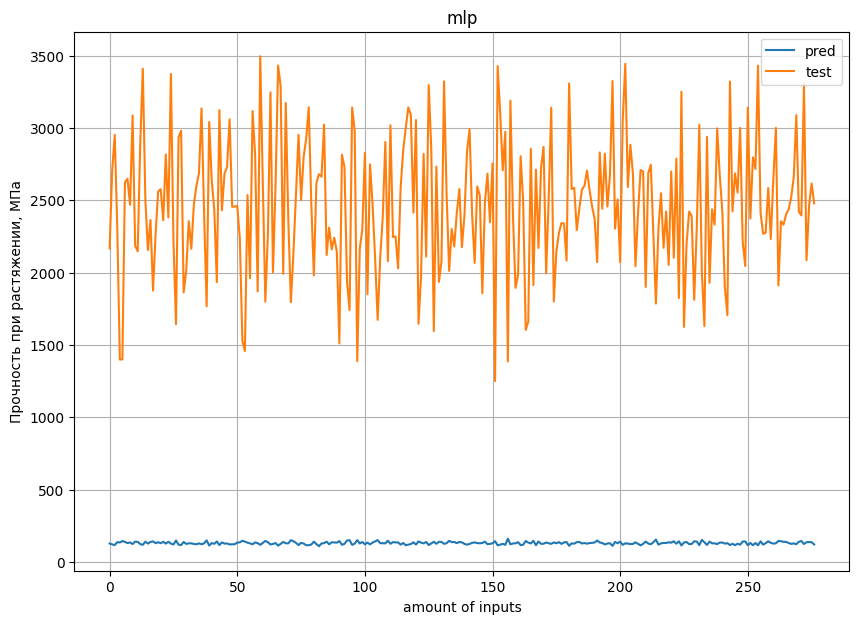

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("mlp")
plt.plot(y_pred_mlp, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#лассо
ls = linear_model.Lasso()
ls.fit(x_train_1, y_train_1)
y_pred_ls = ls.predict(x_test_1)
mae_ls = mean_absolute_error(y_pred_ls, y_test_1)
mse_ls = mean_squared_error(y_test_1, y_pred_ls)
sc_ls = ls.score(x_test_1, y_test_1)
print('lasso regression regressor results:')
print("train test score:",ls.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_ls)))
print('mse:', mean_squared_error(y_test_1,y_pred_ls))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_ls)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_ls))
print('real test score:', ls.score(x_test_1, y_test_1))

lasso regression regressor results:
train test score: 0.9442114213335241
mae: 75
mse: 8965.540800357523
rmse: 94.68653969998863
mape: 0.03163341006586526
real test score: 0.958114026563116


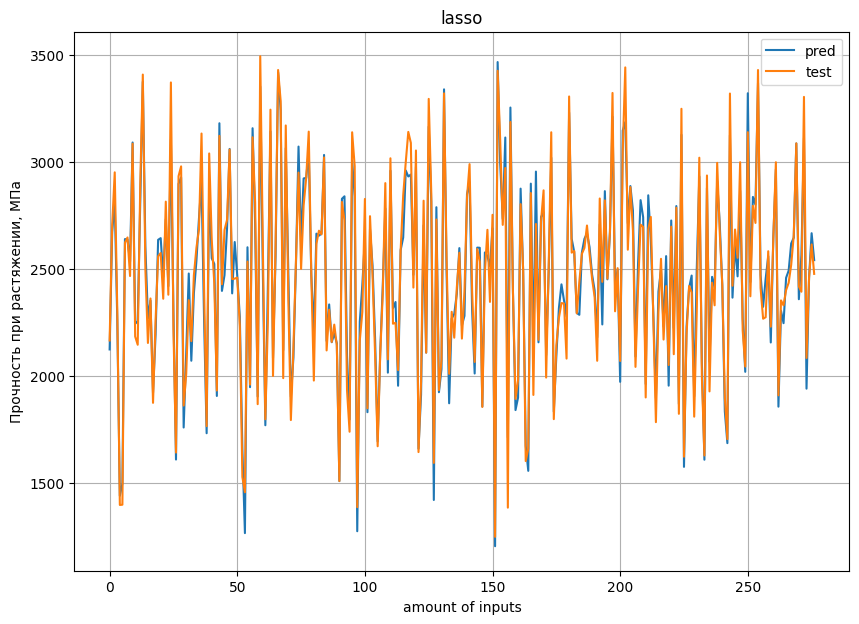

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("lasso")
plt.plot(y_pred_ls, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#дерево решений
dt = DecisionTreeRegressor()
dt.fit(x_train_1, y_train_1)
y_pred_dt = dt.predict(x_test_1)
mae_dt = mean_absolute_error(y_pred_dt, y_test_1)
mse_dt = mean_squared_error(y_test_1, y_pred_dt)
sc_dt = dt.score(x_test_1, y_test_1)
print('decision tree regressor results:')
print("train test score:",dt.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_dt)))
print('mse:', mean_squared_error(y_test_1,y_pred_dt))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_dt)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_dt))
print('real test score:', dt.score(x_test_1, y_test_1))

decision tree regressor results:
train test score: 1.0
mae: 108
mse: 19501.254245004624
rmse: 139.646891282995
mape: 0.047278242239761195
real test score: 0.9088923874776619


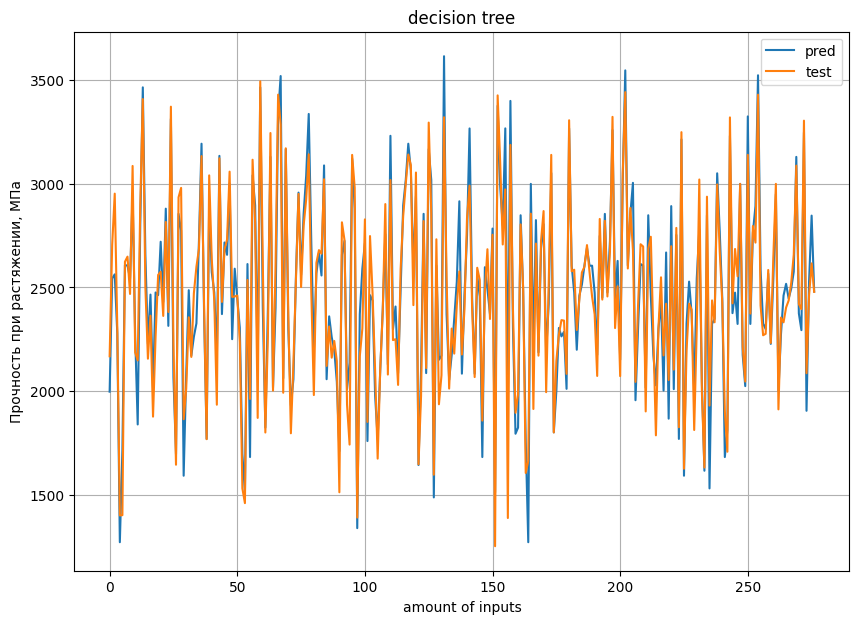

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("decision tree")
plt.plot(y_pred_dt, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#схоастический градиентный спуск
sd = SGDRegressor()
sd.fit(x_train_1, y_train_1)
y_pred_sd = sd.predict(x_test_1)
mae_sd = mean_absolute_error(y_pred_sd, y_test_1)
mse_sd = mean_squared_error(y_test_1, y_pred_sd)
sc_sd = sd.score(x_test_1, y_test_1)
print('k neighbors regression regressor results:')
print("train test score:",sd.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_sd)))
print('mse:', mean_squared_error(y_test_1,y_pred_sd))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_sd)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_sd))
print('real test score:', sd.score(x_test_1, y_test_1))

k neighbors regression regressor results:
train test score: 0.7400530642225238
mae: 182
mse: 52358.19353523185
rmse: 228.8191284294909
mape: 0.07862117459047915
real test score: 0.7553885535234525


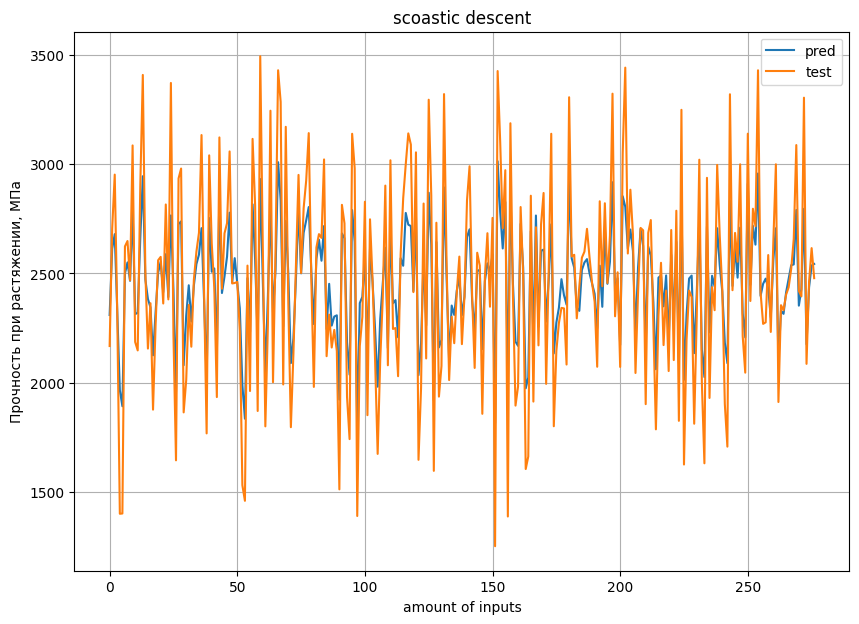

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("scoastic descent")
plt.plot(y_pred_sd, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#support vector
sv = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500, epsilon = 1))
sv.fit(x_train_1, np.ravel(y_train_1))
y_pred_sv = sv.predict(x_test_1)
mae_sv = mean_absolute_error(y_pred_sv, y_test_1)
mse_sv = mean_squared_error(y_test_1, y_pred_sv)
sc_sv = sv.score(x_test_1, y_test_1)
print('support vector regression regressor results:')
print("train test score:",sv.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_sv)))
print('mse:', mean_squared_error(y_test_1,y_pred_sv))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_sv)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_sv))
print('real test score:', sv.score(x_test_1, y_test_1))

support vector regression regressor results:
train test score: 0.9895892559962762
mae: 79
mse: 11675.37354652794
rmse: 108.05264247822883
mape: 0.03518373413831321
real test score: 0.945454000252158


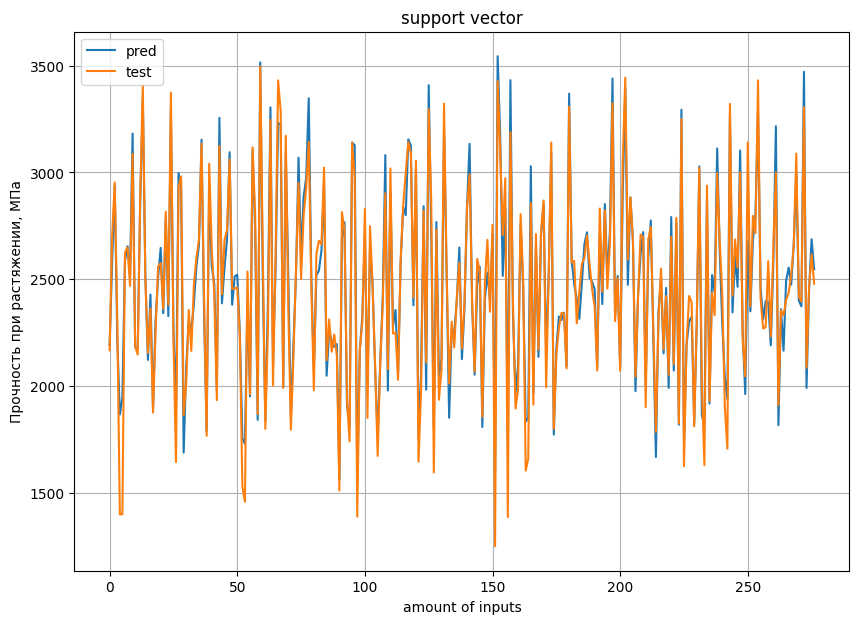

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("support vector")
plt.plot(y_pred_sv, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#gradient boosting
gb = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gb.fit(x_train_1, np.ravel(y_train_1))
y_pred_gb = gb.predict(x_test_1)
mae_gb = mean_absolute_error(y_pred_gb, y_test_1)
mse_gb = mean_squared_error(y_test_1, y_pred_gb)
sc_gb = gb.score(x_test_1, y_test_1)
print('gradient boosting regression regressor results:')
print("train test score:",gb.score(x_train_1, y_train_1))
print('mae:', round(mean_absolute_error(y_test_1, y_pred_gb)))
print('mse:', mean_squared_error(y_test_1,y_pred_gb))
print('rmse:', np.sqrt(mean_squared_error(y_test_1,y_pred_gb)))
print('mape:', mean_absolute_percentage_error(y_test_1, y_pred_gb))
print('real test score:', gb.score(x_test_1, y_test_1))

gradient boosting regression regressor results:
train test score: 0.9918599333984071
mae: 64
mse: 6576.810414747806
rmse: 81.09753642835155
mape: 0.02704347209811665
real test score: 0.9692738996491361


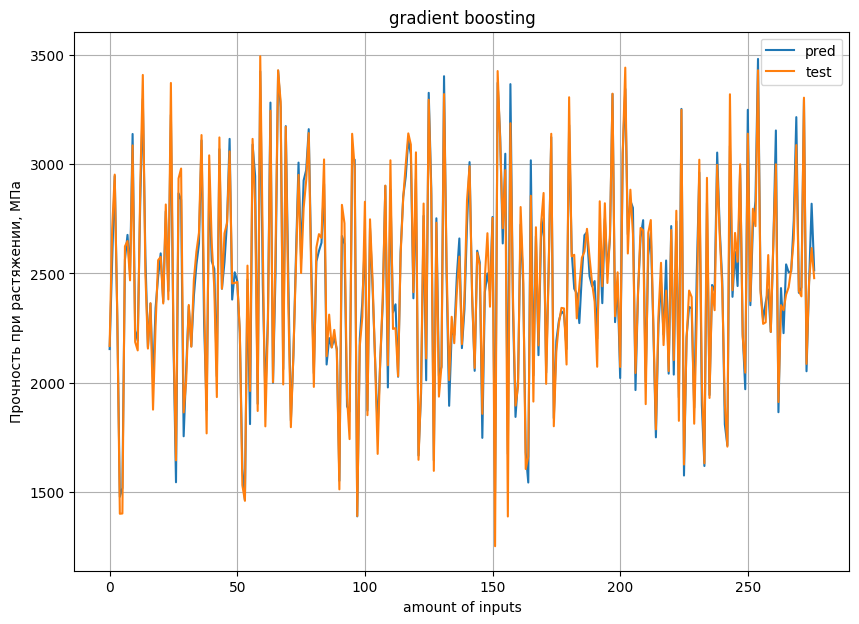

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("gradient boosting")
plt.plot(y_pred_gb, label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#собираем мае и р2 для каждого типа в одну таблицу
maeohmae = {'Regression type': ['Random Forest', 'Linear', 'K-Neighbor', 'Decision tree', 'Lasso', 'Gradient boosting', 'Support Vector', 'Schoastic gradient descent', 'Multi-layer perceptron'],
            'MAE': [mae_rfr, mae_lr, mae_kn, mae_dt, mae_ls, mae_gb, mae_sv, mae_sd, mae_mlp],
            'R2-score': [sc_rfr, sc_lr, sc_kn, sc_dt, sc_ls, sc_gb, sc_sv, sc_sd, sc_mlp]}
maeohmae = pd.DataFrame(maeohmae)
maeohmae

,Regression type,MAE,R2-score
0,Random Forest,67.902949,0.963808
1,Linear,61.997363,0.971266
2,K-Neighbor,101.706291,0.923531
3,Decision tree,108.276513,0.908892
4,Lasso,75.277093,0.958114
5,Gradient boosting,63.599787,0.969274
6,Support Vector,78.504335,0.945454
7,Schoastic gradient descent,181.835147,0.755389
8,Multi-layer perceptron,101.706291,-25.451657


In [ ]:
#grid search for random forest поиск гиперпараметров
para = {'n_estimators':[200, 300], 'max_depth':[9, 15],'criterion': ['squared_error']}
grid = GridSearchCV(estimator = rfr, param_grid = para, cv = 10)
grid.fit(x_train_1, y_train_1)
print(grid.best_params_)
print('r2-score for rfr:', grid.best_estimator_.score(x_test_1, y_test_1))

{'criterion': 'squared_error', 'max_depth': 15, 'n_estimators': 300}
r2-score for rfr: 0.963924333147348


In [ ]:
#параметры нашлись, подставляем
rf_grid = RandomForestRegressor(criterion = 'squared_error', max_depth = 15, n_estimators = 200)
rf_grid.fit(x_train_1, y_train_1)
mae_rf_grid = mean_absolute_error(rf_grid.predict(x_test_1), y_test_1)
sc_rf_grid = rf_grid.score(x_test_1, y_test_1)
mae_rf_grid

68.37581792277824

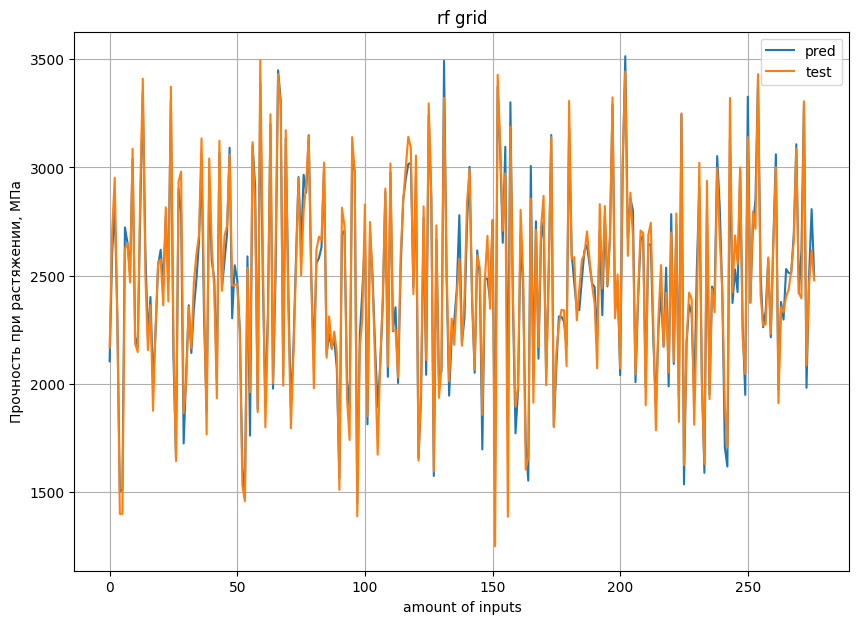

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("rf grid")
plt.plot(rf_grid.predict(x_test_1), label = "pred")
plt.plot(y_test_1.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True);

In [ ]:
#добавим новые данные в таблицу
maeohmae.loc[-1] = ['Random forest gridsearch', mae_rf_grid, sc_rf_grid]
maeohmae.index = maeohmae.index + 1
maeohmae = maeohmae.sort_index()
maeohmae

,Regression type,MAE,R2-score
0,Random forest gridsearch,68.375818,0.963427
1,Random Forest,67.902949,0.963808
2,Linear,61.997363,0.971266
3,K-Neighbor,101.706291,0.923531
4,Decision tree,108.276513,0.908892
5,Lasso,75.277093,0.958114
6,Gradient boosting,63.599787,0.969274
7,Support Vector,78.504335,0.945454
8,Schoastic gradient descent,181.835147,0.755389
9,Multi-layer perceptron,101.706291,-25.451657


In [ ]:
#всё то же самое для модуля упругости
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(
    normnorm.loc[:, normnorm.columns != 'Модуль упругости при растяжении, ГПа'],
    dat[['Модуль упругости при растяжении, ГПа']],
       test_size = 0.3,
    random_state = 42)

In [ ]:
#random forest
rfr2 = RandomForestRegressor()
rfr2.fit(x_train_2, y_train_2.values)
y_pred_forest2 = rfr2.predict(x_test_2)
mae_rfr2 = mean_absolute_error(y_pred_forest2, y_test_2)
mse_rfr2 = mean_squared_error(y_test_2, y_pred_forest2)
sc_rfr_2 = rfr2.score(x_test_2, y_test_2)
print('random forest regressor results:')
print("train test score:",rfr2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_forest2)))
print('mse:', mean_squared_error(y_test_2,y_pred_forest2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_forest2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_forest2))
print('real test score:', rfr2.score(x_test_2, y_test_2))

random forest regressor results:
train test score: 0.8475463090723878
mae: 3
mse: 10.703808487140508
rmse: 3.2716675392130705
mape: 0.03613389552897116
real test score: -0.08006244834887855


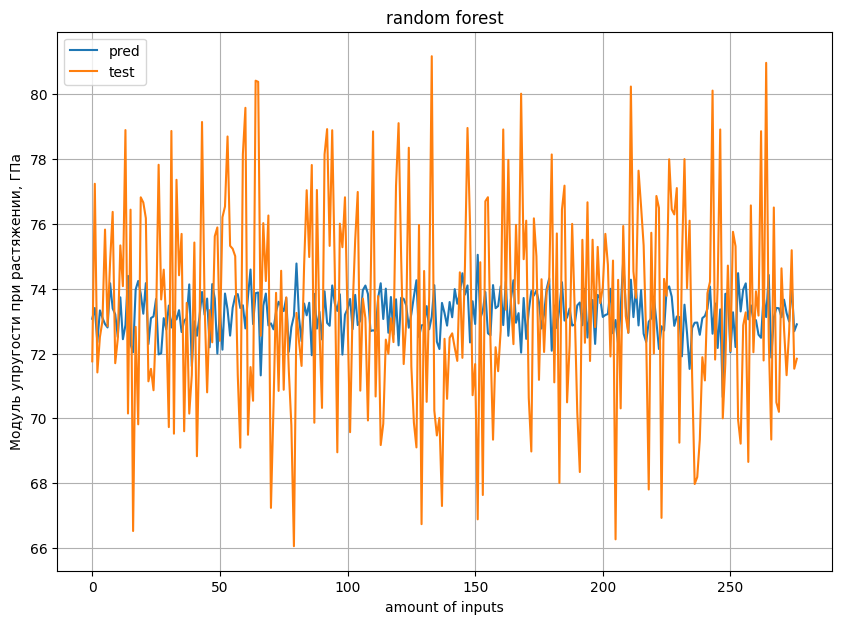

In [ ]:
#график чтобы наглядно посмотреть разницу в тестовых и предсказанных значениях
plt.figure(figsize = (10, 7))
plt.title("random forest")
plt.plot(y_pred_forest2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#linear regression
lr2 = LinearRegression()
lr2.fit(x_train_2, y_train_2.values)
y_pred_lr2 = lr2.predict(x_test_2)
mae_lr2 = mean_absolute_error(y_pred_lr2, y_test_2)
mse_lr2 = mean_squared_error(y_test_2, y_pred_lr2)
sc_lr_2 = lr2.score(x_test_2, y_test_2)
print('linear regression regressor results:')
print("train test score:",lr2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_lr2)))
print('mse:', mean_squared_error(y_test_2,y_pred_lr2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_lr2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_lr2))
print('real test score:', lr2.score(x_test_2, y_test_2))

linear regression regressor results:
train test score: 0.01581059128848572
mae: 3
mse: 10.158419271674038
rmse: 3.1872275211653838
mape: 0.03542371633506125
real test score: -0.025030222009302605


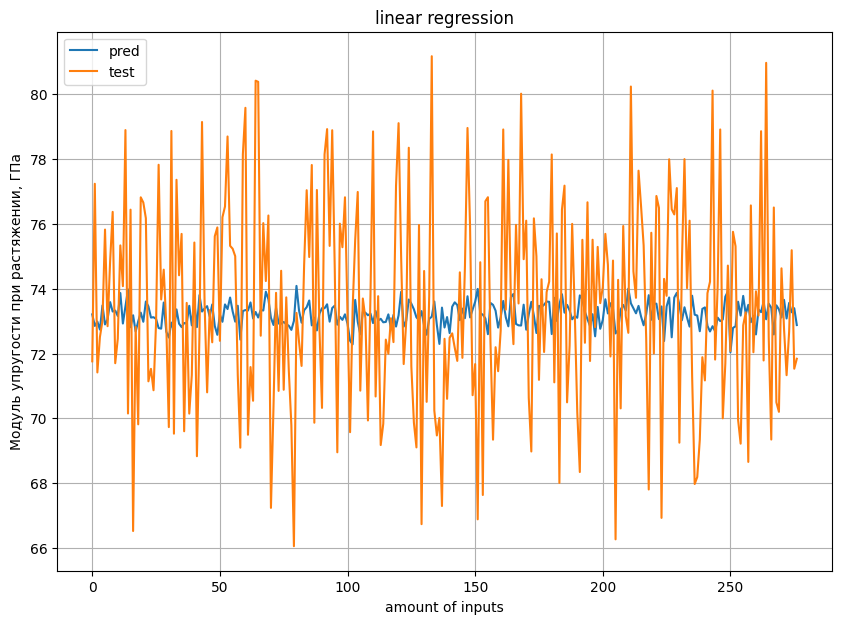

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("linear regression")
plt.plot(y_pred_lr2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#k-neighbours
kn2 = KNeighborsRegressor()
kn2.fit(x_train_2, y_train_2)
y_pred_kn2 = kn2.predict(x_test_2)
mae_kn2 = mean_absolute_error(y_pred_kn2, y_test_2)
mse_kn2 = mean_squared_error(y_test_2, y_pred_kn2)
sc_kn_2 = kn2.score(x_test_2, y_test_2)
print('k neighbors regression regressor results:')
print("train test score:",kn2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_kn2)))
print('mse:', mean_squared_error(y_test_2,y_pred_kn2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_kn2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_kn2))
print('real test score:', kn2.score(x_test_2, y_test_2))

k neighbors regression regressor results:
train test score: 0.1657961535531114
mae: 3
mse: 11.769796508902603
rmse: 3.430713702555578
mape: 0.038124768959685855
real test score: -0.1876254371745989


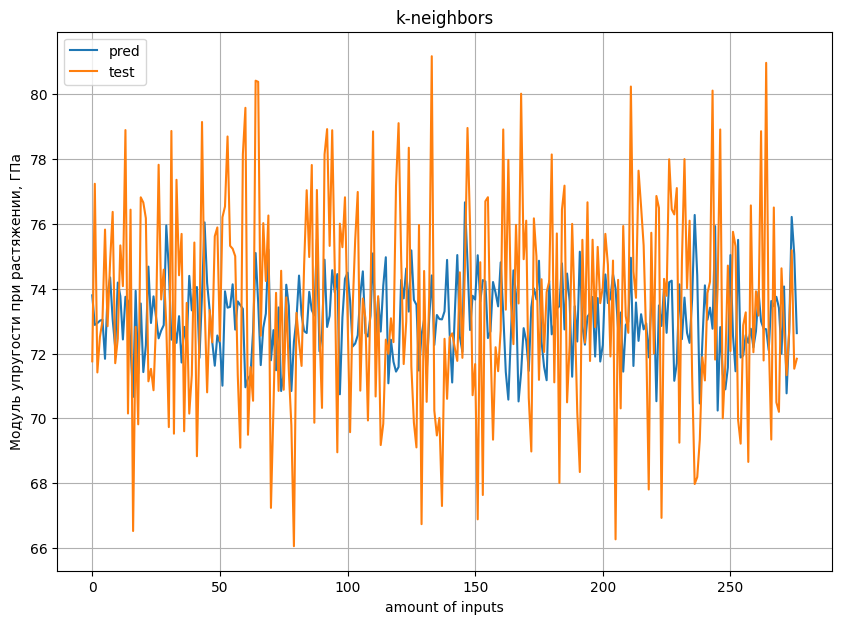

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("k-neighbors")
plt.plot(y_pred_kn2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#multi-layer perceptron
mlp2 = MLPRegressor()
mlp2.fit(x_train_2, y_train_2)
y_pred_mlp2 = mlp2.predict(x_test_2)
mae_mlp2 = mean_absolute_error(y_pred_kn2, y_test_2)
mse_mlp2 = mean_squared_error(y_test_2, y_pred_mlp2)
sc_mlp_2 = mlp2.score(x_test_2, y_test_2)
print('multi-layered perceptron regression regressor results:')
print("train test score:",mlp2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_mlp2)))
print('mse:', mean_squared_error(y_test_2,y_pred_mlp2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_mlp2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_mlp2))
print('real test score:', mlp2.score(x_test_2, y_test_2))

multi-layered perceptron regression regressor results:
train test score: -0.6152415401569797
mae: 3
mse: 16.591220479213934
rmse: 4.0732321906827185
mape: 0.043842313353902186
real test score: -0.6741288143752102


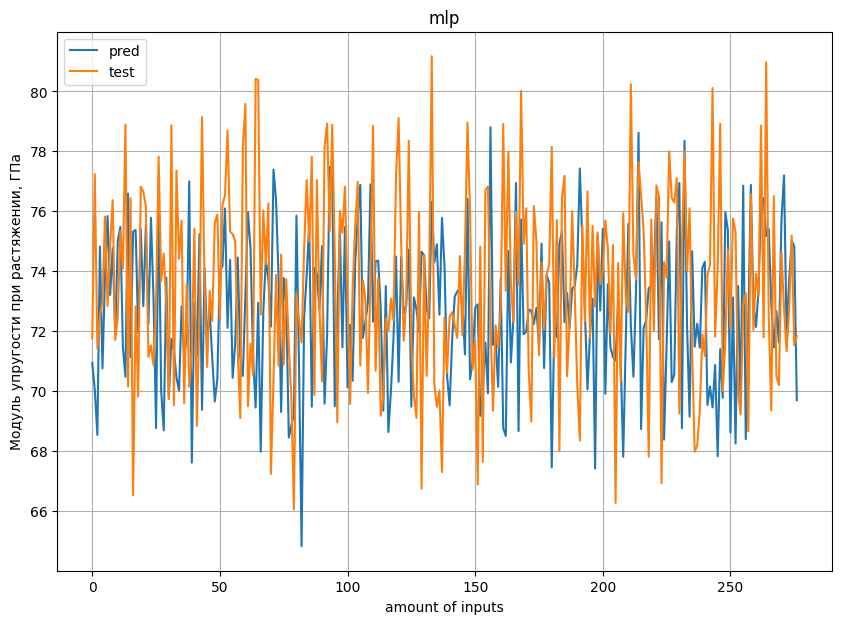

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("mlp")
plt.plot(y_pred_mlp2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#lasso
ls2 = linear_model.Lasso()
ls2.fit(x_train_2, y_train_2)
y_pred_ls2 = ls2.predict(x_test_2)
mae_ls2 = mean_absolute_error(y_pred_ls2, y_test_2)
mse_ls2 = mean_squared_error(y_test_2, y_pred_ls2)
sc_ls_2 = ls2.score(x_test_2, y_test_2)
print('k neighbors regression regressor results:')
print("train test score:",ls2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_ls2)))
print('mse:', mean_squared_error(y_test_2,y_pred_ls2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_ls2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_ls2))
print('real test score:', ls2.score(x_test_2, y_test_2))

k neighbors regression regressor results:
train test score: 0.0
mae: 3
mse: 9.998351572705035
rmse: 3.162017010185909
mape: 0.03503243786306619
real test score: -0.008878670806033773


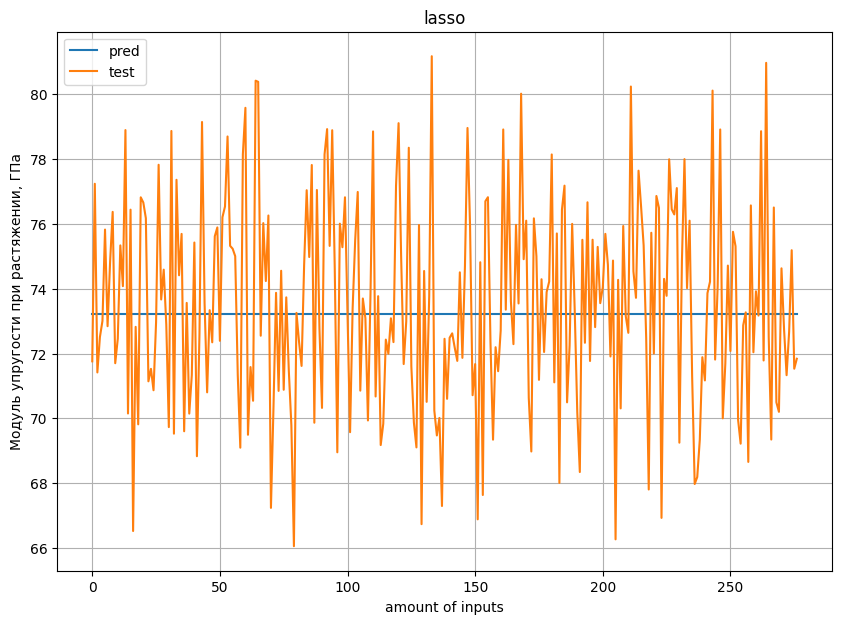

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("lasso")
plt.plot(y_pred_ls2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#decision tree
dt2 = DecisionTreeRegressor()
dt2.fit(x_train_2, y_train_2)
y_pred_dt2 = dt2.predict(x_test_2)
mae_dt2 = mean_absolute_error(y_pred_dt2, y_test_2)
mse_dt2 = mean_squared_error(y_test_2, y_pred_dt2)
sc_dt_2 = dt2.score(x_test_2, y_test_2)
print('decision tree regressor results:')
print("train test score:",dt2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_dt2)))
print('mse:', mean_squared_error(y_test_2,y_pred_dt2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_dt2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_dt2))
print('real test score:', dt2.score(x_test_2, y_test_2))

decision tree regressor results:
train test score: 1.0
mae: 4
mse: 21.097639690793397
rmse: 4.593216704096749
mape: 0.049465776527908935
real test score: -1.1288467937553892


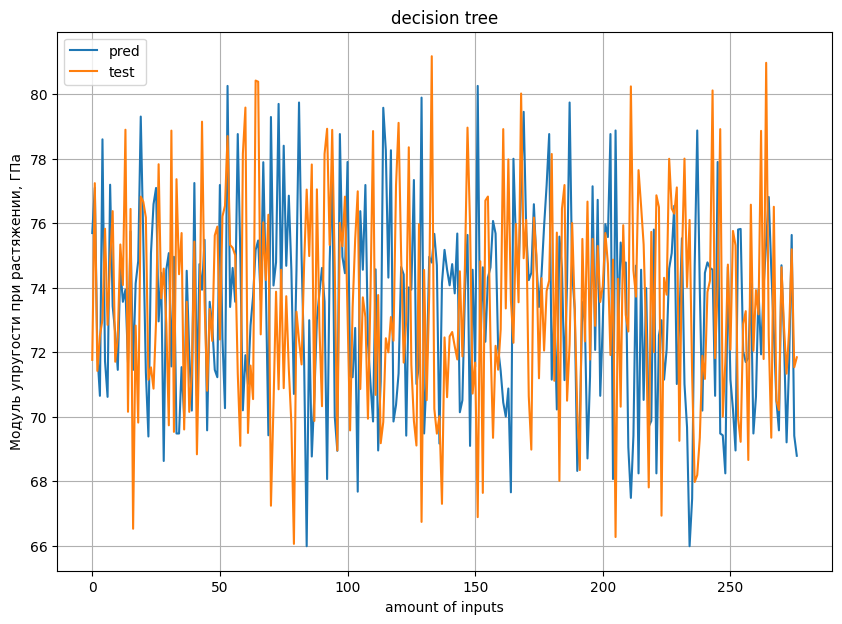

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("decision tree")
plt.plot(y_pred_dt2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#schoastic gradient descent
sd2 = SGDRegressor()
sd2.fit(x_train_2, y_train_2)
y_pred_sd2 = sd2.predict(x_test_2)
mae_sd2 = mean_absolute_error(y_pred_sd2, y_test_2)
mse_sd2 = mean_squared_error(y_test_2, y_pred_sd2)
sc_sd_2 = sd2.score(x_test_2, y_test_2)
print('k neighbors regression regressor results:')
print("train test score:",sd2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_sd2)))
print('mse:', mean_squared_error(y_test_2,y_pred_sd2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_sd2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_sd2))
print('real test score:', sd2.score(x_test_2, y_test_2))

k neighbors regression regressor results:
train test score: -0.01723711869108291
mae: 3
mse: 10.26838102115186
rmse: 3.204431466134338
mape: 0.03538953868395752
real test score: -0.036125857409396556


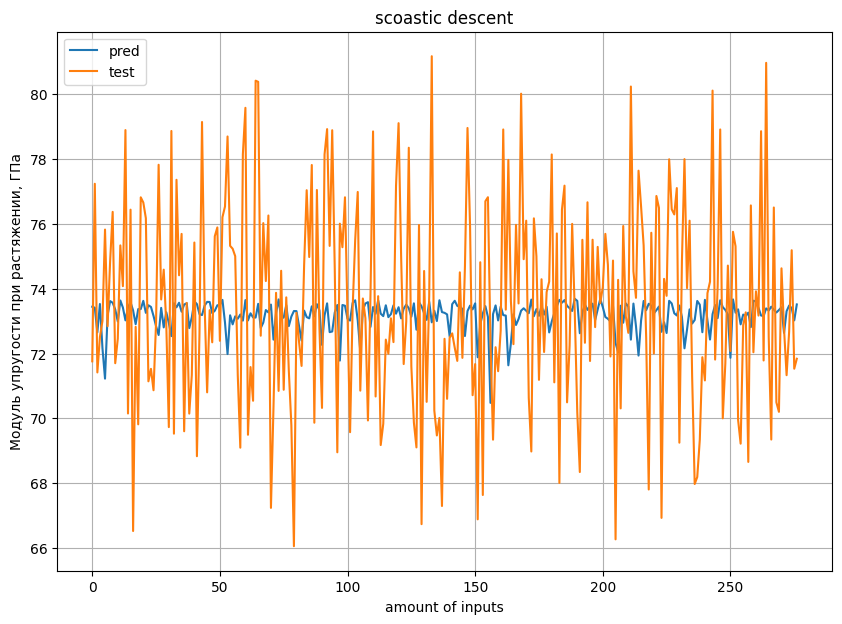

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("scoastic descent")
plt.plot(y_pred_sd2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#support vector
sv2 = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500, epsilon = 1))
sv2.fit(x_train_2, np.ravel(y_train_2))
y_pred_sv2 = sv2.predict(x_test_2)
mae_sv2 = mean_absolute_error(y_pred_sv2, y_test_2)
mse_sv2 = mean_squared_error(y_test_2, y_pred_sv2)
sc_sv_2 = sv2.score(x_test_2, y_test_2)
print('support vector regression regressor results:')
print("train test score:",sv2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_sv2)))
print('mse:', mean_squared_error(y_test_2,y_pred_sv2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_sv2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_sv2))
print('real test score:', sv2.score(x_test_2, y_test_2))

support vector regression regressor results:
train test score: 0.9005650630719959
mae: 3
mse: 19.210512511705776
rmse: 4.382979866678123
mape: 0.046751855145865655
real test score: -0.938427168456619


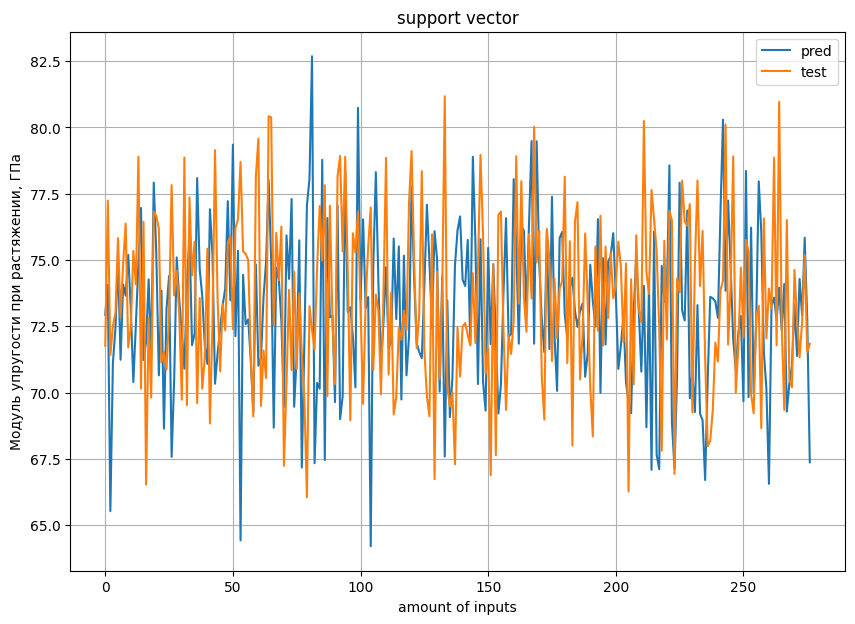

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("support vector")
plt.plot(y_pred_sv2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
#gradient boosting
gb2 = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gb2.fit(x_train_2, np.ravel(y_train_2))
y_pred_gb2 = gb2.predict(x_test_2)
mae_gb2 = mean_absolute_error(y_pred_gb2, y_test_2)
mse_gb2 = mean_squared_error(y_test_2, y_pred_gb2)
sc_gb_2 = gb2.score(x_test_2, y_test_2)
print('gradient boosting regression regressor results:')
print("train test score:",gb2.score(x_train_2, y_train_2))
print('mae:', round(mean_absolute_error(y_test_2, y_pred_gb2)))
print('mse:', mean_squared_error(y_test_2,y_pred_gb2))
print('rmse:', np.sqrt(mean_squared_error(y_test_2,y_pred_gb2)))
print('mape:', mean_absolute_percentage_error(y_test_2, y_pred_gb2))
print('real test score:', gb2.score(x_test_2, y_test_2))

gradient boosting regression regressor results:
train test score: 0.5219376704521401
mae: 3
mse: 10.81488066588896
rmse: 3.2885985869195045
mape: 0.03609955231162174
real test score: -0.09127013105981474


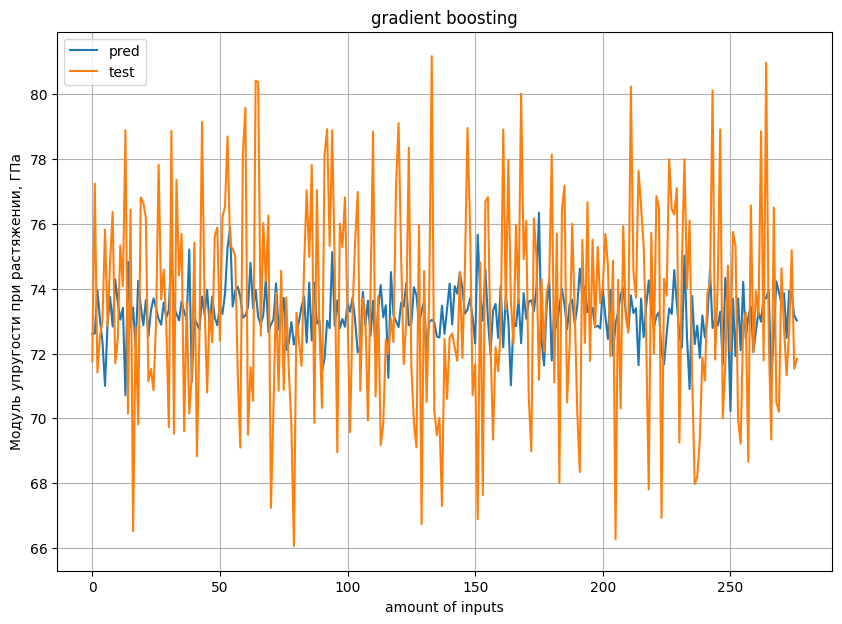

In [ ]:
plt.figure(figsize = (10, 7))
plt.title("gradient boosting")
plt.plot(y_pred_gb2, label = "pred")
plt.plot(y_test_2.values, label = "test")
plt.xlabel("amount of inputs")
plt.ylabel("Модуль упругости при растяжении, ГПа")
plt.legend()
plt.grid(True);

In [ ]:
maeohmae2 = {'Regression type': ['Random Forest', 'Linear', 'K-Neighbor', 'Decision tree', 'Lasso', 'Gradient boosting', 'Support Vector', 'Schoastic gradient descent', 'Multi-layer perceptron'],
            'MAE': [mae_rfr2, mae_lr2, mae_kn2, mae_dt2, mae_ls2, mae_gb2, mae_sv2, mae_sd2, mae_mlp2],
             'R2-score': [sc_rfr_2, sc_lr_2, sc_kn_2, sc_dt_2, sc_ls_2, sc_gb_2, sc_sv_2, sc_sd_2, sc_mlp_2]}
maeohmae2 = pd.DataFrame(maeohmae2)
maeohmae2

,Regression type,MAE,R2-score
0,Random Forest,2.661482,-0.080062
1,Linear,2.609323,-0.025030
2,K-Neighbor,2.809242,-0.187625
3,Decision tree,3.633322,-1.128847
4,Lasso,2.580193,-0.008879
5,Gradient boosting,2.657857,-0.091270
6,Support Vector,3.447736,-0.938427
7,Schoastic gradient descent,2.607499,-0.036126
8,Multi-layer perceptron,2.809242,-0.674129


In [ ]:
paraa = {'n_estimators':[200, 300], 'max_depth':[9, 15],'criterion': ['squared_error']}
gridd = GridSearchCV(estimator = rfr, param_grid = paraa, cv = 10)
gridd.fit(x_train_2, y_train_2)
print(gridd.best_params_)
print('r2-score for rfr:', gridd.best_estimator_.score(x_test_2, y_test_2))

{'criterion': 'squared_error', 'max_depth': 9, 'n_estimators': 300}
r2-score for rfr: -0.029341656790964565


In [ ]:
rf_grid2 = RandomForestRegressor(criterion = 'squared_error', max_depth = 9, n_estimators = 300)
rf_grid2.fit(x_train_2, y_train_2)
mae_rf_grid2 = mean_absolute_error(rf_grid2.predict(x_test_2), y_test_2)
sc_rf_grid2 = rf_grid2.score(x_test_2, y_test_2)
mae_rf_grid2

2.6146292697641704

In [ ]:
maeohmae2.loc[-1] = ['Random forest gridsearch', mae_rf_grid2, sc_rf_grid2]
maeohmae2.index = maeohmae2.index + 1
maeohmae2 = maeohmae2.sort_index()
maeohmae2

,Regression type,MAE,R2-score
0,Random forest gridsearch,2.614629,-0.043445
1,Random Forest,2.661482,-0.080062
2,Linear,2.609323,-0.025030
3,K-Neighbor,2.809242,-0.187625
4,Decision tree,3.633322,-1.128847
5,Lasso,2.580193,-0.008879
6,Gradient boosting,2.657857,-0.091270
7,Support Vector,3.447736,-0.938427
8,Schoastic gradient descent,2.607499,-0.036126
9,Multi-layer perceptron,2.809242,-0.674129


In [31]:
from tensorflow.keras.layers import Normalization
nono = Normalization(axis = -1)

In [32]:
x_train_st = nono.adapt(np.array(x_train_1))

NameError: name 'x_train_1' is not defined

In [ ]:
#модель для предсказания прочности
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
model_st = Sequential(x_train_st)

model_st.add(Dense(128))
model_st.add(BatchNormalization())
model_st.add(LeakyReLU())
model_st.add(Dense(64))
model_st.add(BatchNormalization())
model_st.add(LeakyReLU())
model_st.add(Dense(64))
model_st.add(BatchNormalization())
model_st.add(LeakyReLU())
model_st.add(Dense(32))
model_st.add(BatchNormalization())
model_st.add(LeakyReLU())
model_st.add(Dense(32))
model_st.add(BatchNormalization())
model_st.add(LeakyReLU())
model_st.add(Dense(1))
model_st.add(Activation(activation='selu'))
stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=20, verbose=1, mode='auto')
model_st.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01),
    loss='mean_absolute_error')

In [ ]:
%%time
hist_st = model_st.fit(x_train_1, y_train_1, batch_size = 32, epochs = 40, verbose = 1, validation_split = 0.1)

Epoch 1/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 2455.6250 - val_loss: 2442.7241
Epoch 2/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2494.5964 - val_loss: 2442.1553
Epoch 3/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2474.3718 - val_loss: 2441.3081
Epoch 4/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2448.8806 - val_loss: 2439.8376
Epoch 5/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2450.7778 - val_loss: 2437.5427
Epoch 6/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2463.1194 - val_loss: 2434.1152
Epoch 7/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2460.5027 - val_loss: 2429.0999
Epoch 8/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2428.6128 - val_loss: 2421.6436
Epoch 9/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2434.3062 - val_loss: 2412.2153
Epoch 10/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2436.3564 - val_loss: 2399.9272
Epoch 11/40
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2402.6824 - val_loss: 2384.4829
Epoch 1

In [ ]:
model_st.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 128)                 │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_8 (LeakyReLU)            │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_9 (LeakyReLU)            │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              33 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,531 (72.39 KB)

 Trainable params: 17,889 (69.88 KB)

 Non-trainable params: 640 (2.50 KB)

 Optimizer params: 2 (12.00 B)

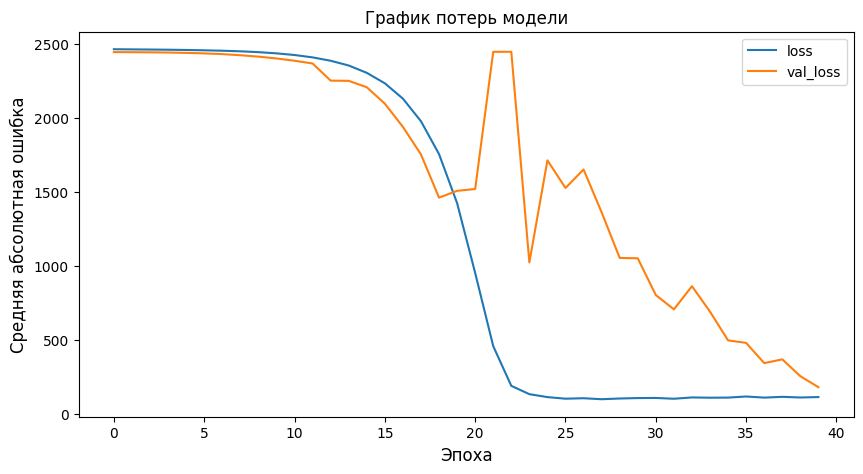

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(hist_st.history['loss'])
plt.plot(hist_st.history['val_loss'])
plt.title('График потерь модели', size=12)
plt.ylabel('Средняя абсолютная ошибка', size=12)
plt.xlabel('Эпоха', size=12)
plt.legend(['loss', 'val_loss'], loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


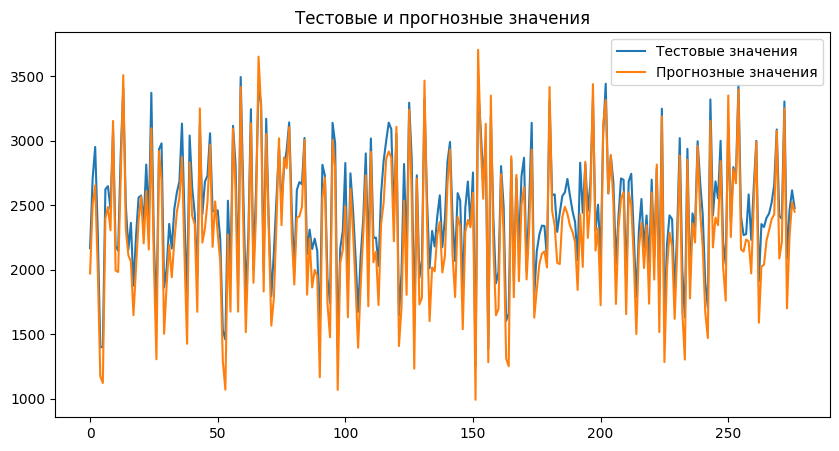

In [ ]:
plt.figure(figsize=(10,5))
plt.title('Тестовые и прогнозные значения', size=12)
plt.plot(y_test_1.values, label = 'Тестовые значения')
plt.plot(model_st.predict(np.array((x_test_1))), label = 'Прогнозные значения')
plt.legend(loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


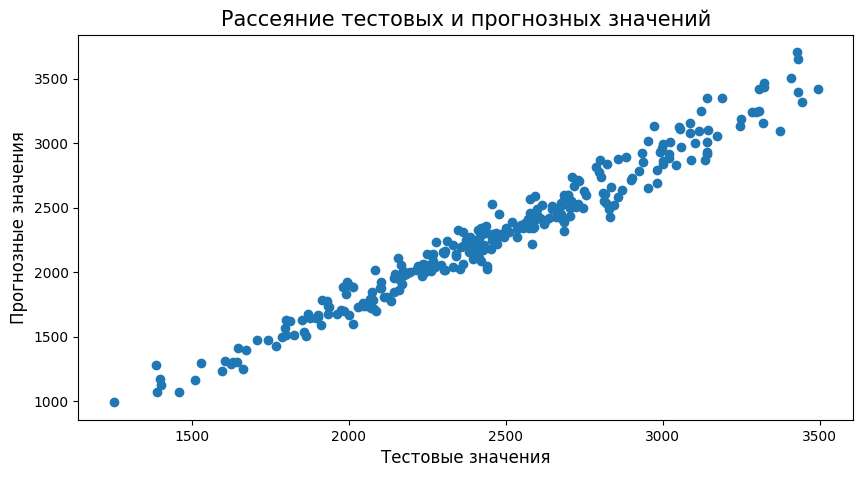

In [ ]:
plt.figure(figsize=(10,5))
plt.title('Рассеяние тестовых и прогнозных значений', size=15)
plt.scatter(y_test_1.values, model_st.predict(np.array((x_test_1))))
plt.xlabel('Тестовые значения', size=12)
plt.ylabel('Прогнозные значения', size=12)
plt.show()

In [36]:
x_train_el = nono.adapt(np.array(x_train_2))

NameError: name 'x_train_2' is not defined

In [35]:
#модель для предсказания модуля упругости
from tensorflow.keras.layers import LeakyReLU
model_el = Sequential(x_train_el)

model_el.add(Dense(128))
model_el.add(BatchNormalization())
model_el.add(LeakyReLU())
model_el.add(Dense(64))
model_el.add(BatchNormalization())
model_el.add(LeakyReLU())
model_el.add(Dense(64))
model_el.add(BatchNormalization())
model_el.add(LeakyReLU())
model_el.add(Dense(32))
model_el.add(BatchNormalization())
model_el.add(LeakyReLU())
model_el.add(Dense(32))
model_el.add(BatchNormalization())
model_el.add(LeakyReLU())
model_el.add(Dense(1))
model_el.add(Activation(activation='elu'))
model_el.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=False),
    loss='mean_absolute_error')

NameError: name 'x_train_el' is not defined

In [ ]:
%%time
hist_el = model_el.fit(x_train_2, y_train_2, batch_size = 32, epochs = 20, verbose = 1, validation_split = 0.1)

Epoch 1/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 2.7488 - val_loss: 2.5069
Epoch 2/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.3338 - val_loss: 2.4908
Epoch 3/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.5845 - val_loss: 2.3933
Epoch 4/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.5163 - val_loss: 2.3455
Epoch 5/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.4781 - val_loss: 3.2136
Epoch 6/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.7926 - val_loss: 3.1240
Epoch 7/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.6617 - val_loss: 3.0355
Epoch 8/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.5653 - val_loss: 2.3095
Epoch 9/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.5382 - val_loss: 2.2925
Epoch 10/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.5407 - val_loss: 2.3303
Epoch 11/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.5883 - val_loss: 2.4657
Epoch 12/20
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.5265 

In [ ]:
model_el.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                     │ (None, 128)                 │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_15 (LeakyReLU)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_16 (LeakyReLU)           │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_17 (LeakyReLU)           │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_18 (LeakyReLU)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_19 (LeakyReLU)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │              33 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36,420 (142.27 KB)

 Trainable params: 17,889 (69.88 KB)

 Non-trainable params: 640 (2.50 KB)

 Optimizer params: 17,891 (69.89 KB)

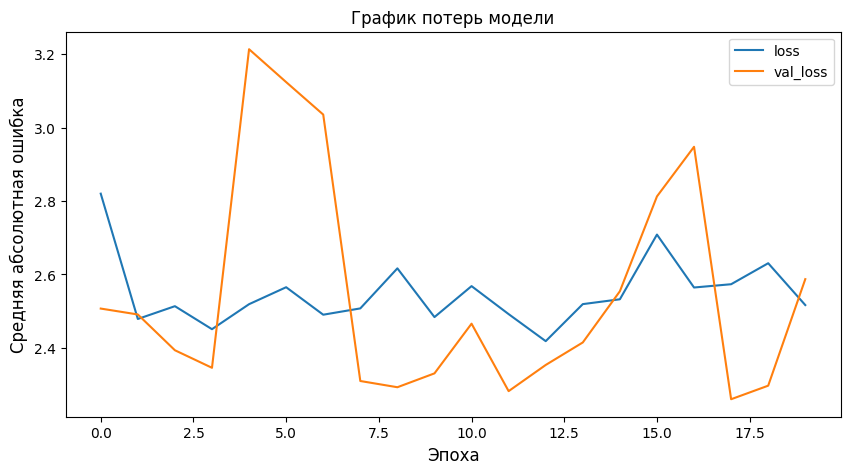

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(hist_el.history['loss'])
plt.plot(hist_el.history['val_loss'])
plt.title('График потерь модели', size=12)
plt.ylabel('Средняя абсолютная ошибка', size=12)
plt.xlabel('Эпоха', size=12)
plt.legend(['loss', 'val_loss'], loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


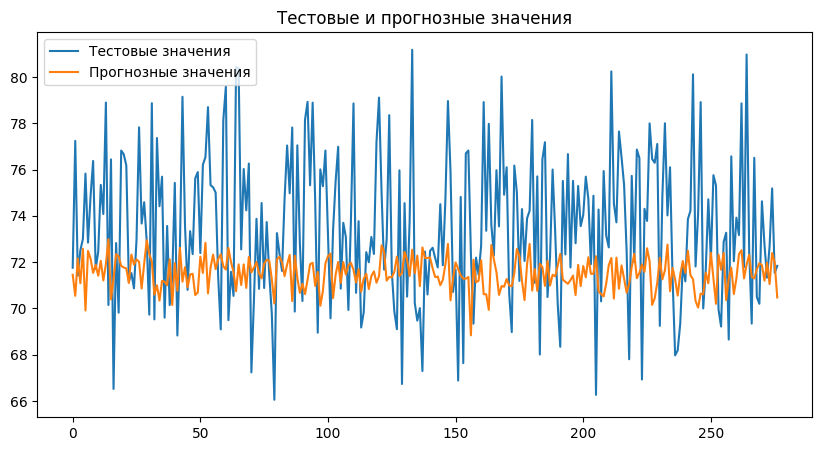

In [ ]:
plt.figure(figsize=(10,5))
plt.title('Тестовые и прогнозные значения', size=12)
plt.plot(y_test_2.values, label = 'Тестовые значения')
plt.plot(model_el.predict(np.array((x_test_2))), label = 'Прогнозные значения')
plt.legend(loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


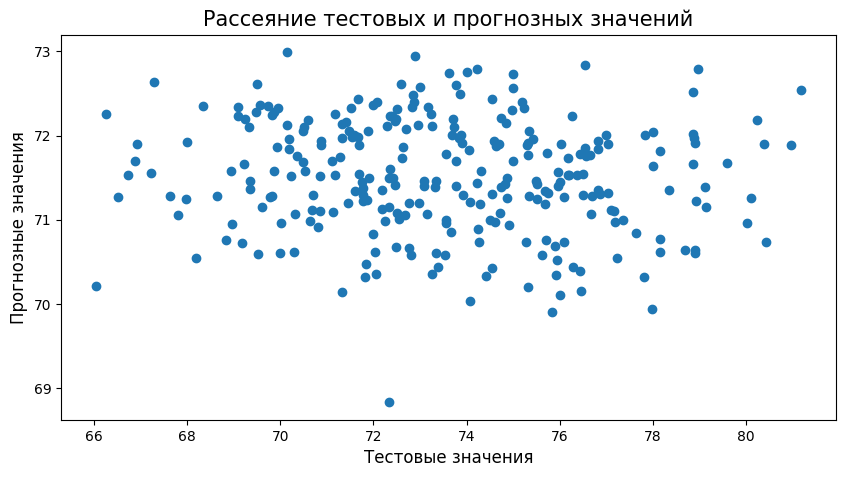

In [ ]:
plt.figure(figsize=(10,5))
plt.title('Рассеяние тестовых и прогнозных значений', size=15)
plt.scatter(y_test_2.values, model_el.predict(np.array((x_test_2))))
plt.xlabel('Тестовые значения', size=12)
plt.ylabel('Прогнозные значения', size=12)
plt.show()

In [ ]:
print('Model MAE', model_el.evaluate(x_test_2, y_test_2, verbose = 1))
print('mean MAE', np.mean(np.abs(y_test_2 - np.mean(y_test_2))))

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0657 
Model MAE 3.083866834640503
mean MAE 2.5784995357561793


In [33]:
x_mf = dat.drop(['Соотношение матрица-наполнитель'], axis=1)
y_mf = dat[['Соотношение матрица-наполнитель']]
x_train_mf, x_test_mf, y_train_mf, y_test_mf = train_test_split(x_mf, y_mf, test_size=0.3, random_state=1)
x_train_mfn = nono.adapt(np.array(x_train_mf))

In [38]:
#модель для предсказания соотношения матрица-наполнитель
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping
model_mf = Sequential(x_train_mfn)

model_mf.add(Dense(128))
model_mf.add(BatchNormalization())
model_mf.add(LeakyReLU())
model_mf.add(Dense(128, activation='selu'))
model_mf.add(BatchNormalization())
model_mf.add(Dense(64, activation='selu'))
model_mf.add(BatchNormalization())
model_mf.add(Dense(32, activation='selu'))
model_mf.add(BatchNormalization())
model_mf.add(LeakyReLU())
model_mf.add(Dense(16, activation='selu'))
model_mf.add(BatchNormalization())
model_mf.add(Dense(1))
model_mf.add(Activation('selu'))

stop_mf = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto')
model_mf.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01, momentum = 0.5),
    loss='mean_absolute_error')

In [ ]:
#import os
#checkpoint_path = "training_1/cp.weights.h5"
#checkpoint_dir = os.path.dirname(checkpoint_path)
#cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 #save_weights_only=True,
                                                 #verbose=1)

In [39]:
%%time
hist_mf = model_mf.fit(x_train_mf, y_train_mf, batch_size = 32, epochs = 50, verbose = 1, validation_split = 0.1, callbacks = [stop_mf])

Epoch 1/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 2.5218 - val_loss: 4.1674
Epoch 2/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.8988 - val_loss: 2.7876
Epoch 3/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.7066 - val_loss: 4.5164
Epoch 4/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.5392 - val_loss: 2.7804
Epoch 5/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2572 - val_loss: 2.1389
Epoch 6/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8808 - val_loss: 1.2835
Epoch 7/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.7344 - val_loss: 0.9705
Epoch 8/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7393 - val_loss: 0.9047
Epoch 9/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.7071 - val_loss: 0.9306
Epoch 10/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.6976 - val_loss: 0.9526
Epoch 11/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7455 - val_loss: 1.0468
Epoch 12/50
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7556 - va

In [ ]:
model_mf.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                     │ (None, 128)                 │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_20 (LeakyReLU)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_21 (LeakyReLU)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 16)                  │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 1)                   │              17 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 1)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 60,324 (235.64 KB)

 Trainable params: 29,793 (116.38 KB)

 Non-trainable params: 736 (2.88 KB)

 Optimizer params: 29,795 (116.39 KB)

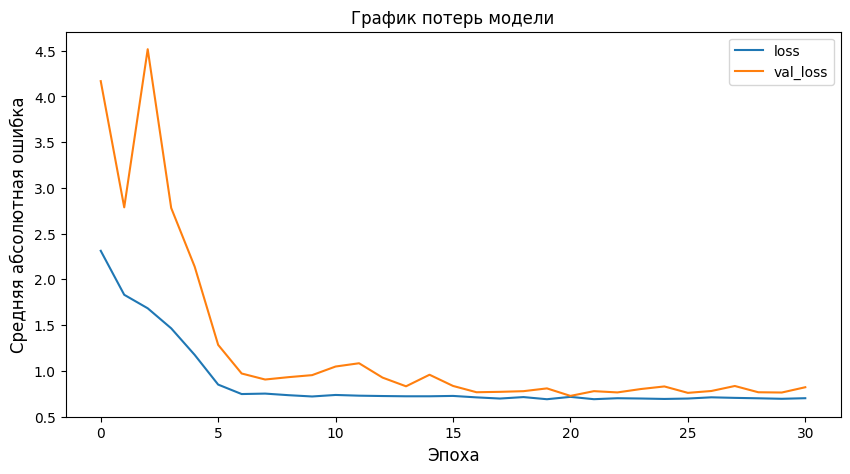

In [40]:
plt.figure(figsize=(10, 5))
plt.plot(hist_mf.history['loss'])
plt.plot(hist_mf.history['val_loss'])
plt.title('График потерь модели', size=12)
plt.ylabel('Средняя абсолютная ошибка', size=12)
plt.xlabel('Эпоха', size=12)
plt.legend(['loss', 'val_loss'], loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


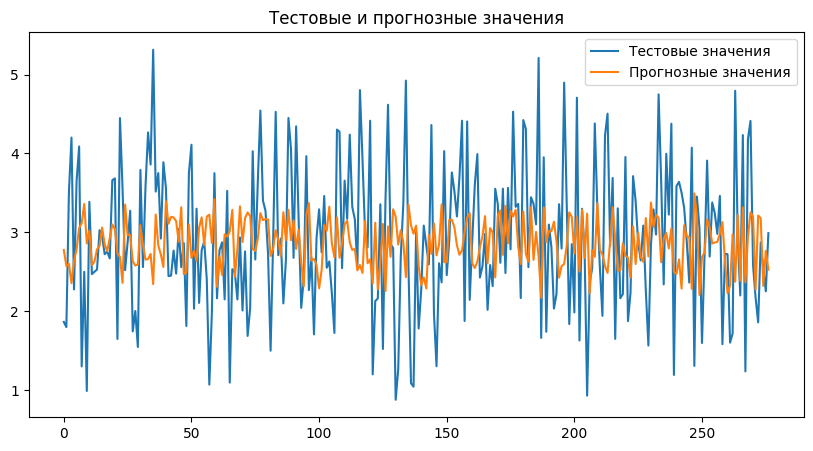

In [41]:
plt.figure(figsize=(10,5))
plt.title('Тестовые и прогнозные значения', size=12)
plt.plot(y_test_mf.values, label = 'Тестовые значения')
plt.plot(model_mf.predict(np.array((x_test_mf))), label = 'Прогнозные значения')
plt.legend(loc='best')
plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


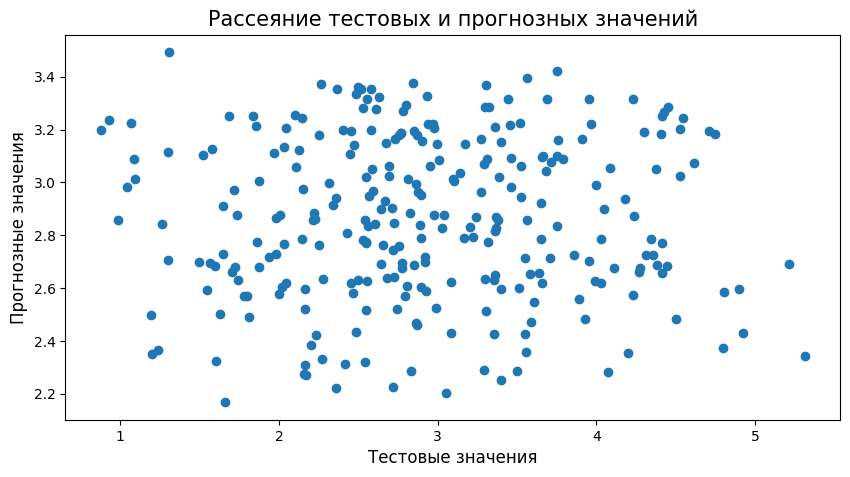

In [42]:
plt.figure(figsize=(10,5))
plt.title('Рассеяние тестовых и прогнозных значений', size=15)
plt.scatter(y_test_mf.values, model_mf.predict(np.array((x_test_mf))))
plt.xlabel('Тестовые значения', size=12)
plt.ylabel('Прогнозные значения', size=12)
plt.show()

In [ ]:
pred_mf = model_mf.predict(x_test_mf)
pred_mf

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


array([[2.6425161],
       [3.0223691],
       [2.7806897],
       [3.3967664],
       [3.102094 ],
       [3.4660926],
       [3.2814827],
       [3.0257409],
       [2.7161083],
       [2.7088325],
       [2.6124856],
       [2.1241298],
       [3.366827 ],
       [2.9484878],
       [3.4668355],
       [2.9824069],
       [2.972852 ],
       [3.3281686],
       [3.6883953],
       [2.6456385],
       [3.1916635],
       [3.1292193],
       [2.9465675],
       [3.1939874],
       [3.013984 ],
       [3.0578766],
       [2.728767 ],
       [2.8325865],
       [2.7489057],
       [2.6487167],
       [3.2016242],
       [2.617673 ],
       [2.8800204],
       [2.8776355],
       [3.2835977],
       [3.3816466],
       [2.6707258],
       [3.4441211],
       [2.7702346],
       [3.320072 ],
       [2.6739502],
       [2.9951987],
       [2.738872 ],
       [2.7114573],
       [2.8718197],
       [2.8433108],
       [2.7482772],
       [3.238852 ],
       [3.0528922],
       [2.9883575],


In [ ]:
#model_mf.load_weights(latest)
#model_mf.save('/content/drive/MyDrive/вкр/model_mf.')

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=/content/drive/MyDrive/вкр/model_mf.